
**Install requirements**

In [ ]:
!pip3 install torch torchvision torchaudio

In [ ]:
!pip3 install 'tqdm'

**Import libraries**

In [ ]:
import os
import logging

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Subset, DataLoader
from torch.backends import cudnn

import torchvision
from torchvision import transforms
from torchvision.models import alexnet, resnet50

from PIL import Image
from torchvision.transforms import v2
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from copy import deepcopy

# Step 1: Data Preparation

**Set Arguments**

In [ ]:
DEVICE = 'cuda' # 'cuda' or 'cpu'

NUM_CLASSES = 101 # 101 + 1: There is am extra Background class that should be removed

BATCH_SIZE = 256     # Higher batch sizes allows for larger learning rates. An empirical heuristic suggests that, when changing
                     # the batch size, learning rate should change by the same factor to have comparable results

LR = 1e-3            # The initial Learning Rate
MOMENTUM = 0.9       # Hyperparameter for SGD, keep this at 0.9 when using SGD
WEIGHT_DECAY = 5e-5  # Regularization, you can keep this at the default

NUM_EPOCHS = 30      # Total number of training epochs (iterations over dataset)
STEP_SIZE = 20       # How many epochs before decreasing learning rate (if using a step-down policy)
GAMMA = 0.1          # Multiplicative factor for learning rate step-down

LOG_FREQUENCY = 10

**Define Data Preprocessing**

In [ ]:
# Define transforms for training phase
train_transform = transforms.Compose([transforms.Resize(256),      # Resizes short size of the PIL image to 256
                                      transforms.CenterCrop(224),  # Crops a central square patch of the image
                                                                   # 224 because torchvision's AlexNet needs a 224x224 input!
                                                                   # Remember this when applying different transformations, otherwise you get an error
                                      transforms.ToTensor(), # Turn PIL Image to torch.Tensor
                                      transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # Normalizes tensor with mean and standard deviation
])

# data augmentation
data_aug_train_transform = v2.Compose([v2.ToImage(),
                                                 v2.ToDtype(torch.uint8, scale=True),
                                                 v2.Resize(256),
                                                 v2.CenterCrop(224),
                                                 v2.RandomHorizontalFlip(p=0.5),
                                                 v2.RandomApply(nn.ModuleList([
                                                                v2.ColorJitter(brightness=0.5, contrast=None, saturation=None, hue=None),
                                                                v2.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0))
                                                 ]), p=0.3),
                                                 v2.ToDtype(torch.float32, scale=True),
                                                 v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])
# Define transforms for the evaluation phase
eval_transform = transforms.Compose([transforms.Resize(256),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

**Prepare Dataset**

In [ ]:
from torchvision.datasets import VisionDataset

from PIL import Image

import os
import os.path
import sys


def pil_loader(path):
    # open path as file to avoid ResourceWarning (https://github.com/python-pillow/Pillow/issues/835)
    with open(path, 'rb') as f:
        img = Image.open(f)
        return img.convert('RGB')


class Caltech(VisionDataset):
    def __init__(self, root, split='train', transform=None, target_transform=None):
        super(Caltech, self).__init__(root, transform=transform, target_transform=target_transform)

        self.split = split # This defines the split you are going to use
                           # (split files are called 'train.txt' and 'test.txt')

        '''
        - Here you should implement the logic for reading the splits files and accessing elements
        - If the RAM size allows it, it is faster to store all data in memory
        - PyTorch Dataset classes use indexes to read elements
        - You should provide a way for the __getitem__ method to access the image-label pair
          through the index
        - Labels should start from 0, so for Caltech you will have labels 0...100 (excluding the background class)
        '''
        parent = os.path.abspath(os.path.join(root, os.pardir))
        with open(os.path.join(parent, self.split + '.txt'), 'r') as f:
          self.filenames = [line.strip() for line in f if -1 == line.strip().lower().find('background')]
        self.images = [pil_loader(os.path.join(root, filename)) for filename in self.filenames]
        tmp = [filename.split('/')[0] for filename in self.filenames]
        self.labels = []
        for i, k  in enumerate(dict.fromkeys(tmp)):
          self.labels += [i] * tmp.count(k)

    def __getitem__(self, index):
        '''
        __getitem__ should access an element through its index
        Args:
            index (int): Index

        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        '''

        image, label = self.images[index], self.labels[index] # Provide a way to access image and label via index
                           # Image should be a PIL Image
                           # label can be int

        # Applies preprocessing when accessing the image
        if self.transform is not None:
            image = self.transform(image)

        return image, label

    def __len__(self):
        '''
        The __len__ method returns the length of the dataset
        It is mandatory, as this is used by several other components
        '''
        length = len(self.labels) # Provide a way to get the length (number of elements) of the dataset
        return length

In [ ]:
# Clone github repository with data
import pathlib
print(pathlib.Path().resolve())
if not os.path.isdir('./Caltech101'):
  !git clone https://github.com/MachineLearning2020/Homework2-Caltech101.git
  !mv 'Homework2-Caltech101' 'Caltech101'

DATA_DIR = 'Caltech101/101_ObjectCategories'

# Prepare Pytorch train/test Datasets
train_dataset = Caltech(DATA_DIR, split='train',  transform=train_transform)
test_dataset = Caltech(DATA_DIR, split='test', transform=eval_transform)

train_indexes, val_indexes, _, _ = train_test_split(range(len(train_dataset)), train_dataset.labels, test_size=0.25, random_state=0, stratify=train_dataset.labels)

val_dataset = Subset(train_dataset, val_indexes)
train_dataset = Subset(train_dataset, train_indexes)

# Check dataset sizes
print('Train Dataset: {}'.format(len(train_dataset)))
print('Valid Dataset: {}'.format(len(val_dataset)))
print('Test Dataset: {}'.format(len(test_dataset)))

/content
Cloning into 'Homework2-Caltech101'...
remote: Enumerating objects: 9256, done.
remote: Total 9256 (delta 0), reused 0 (delta 0), pack-reused 9256
Receiving objects: 100% (9256/9256), 129.48 MiB | 36.81 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (9149/9149), done.
Train Dataset: 4338
Valid Dataset: 1446
Test Dataset: 2893


**Prepare Dataloaders**

In [ ]:
# Dataloaders iterate over pytorch datasets and transparently provide useful functions (e.g. parallelization and shuffling)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


**Prepare Network**

In [ ]:
net = alexnet() # Loading AlexNet model

# AlexNet has 1000 output neurons, corresponding to the 1000 ImageNet's classes
# We need 101 outputs for Caltech-101
net.classifier[6] = nn.Linear(4096, NUM_CLASSES) # nn.Linear in pytorch is a fully connected layer
                                                 # The convolutional layer is nn.Conv2d

# We just changed the last layer of AlexNet with a new fully connected layer with 101 outputs
# It is strongly suggested to study torchvision.models.alexnet source code

**Prepare Training**

In [ ]:
# Define loss function
criterion = nn.CrossEntropyLoss() # for classification, we use Cross Entropy

# Choose parameters to optimize
# To access a different set of parameters, you have to access submodules of AlexNet
# (nn.Module objects, like AlexNet, implement the Composite Pattern)
# e.g.: parameters of the fully connected layers: net.classifier.parameters()
# e.g.: parameters of the convolutional layers: look at alexnet's source code ;)
parameters_to_optimize = net.parameters() # In this case we optimize over all the parameters of AlexNet

# Define optimizer
# An optimizer updates the weights based on loss
# We use SGD with momentum
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)

# Define scheduler
# A scheduler dynamically changes learning rate
# The most common schedule is the step(-down), which multiplies learning rate by gamma every STEP_SIZE epochs
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

**Train**

In [ ]:
# By default, everything is loaded to cpu
net = net.to(DEVICE) # this will bring the network to GPU if DEVICE is cuda

cudnn.benchmark # Calling this optimizes runtime

current_step = 0
# Start iterating over the epochs
for epoch in range(NUM_EPOCHS):
  print('Starting epoch {}/{}, LR = {}'.format(epoch+1, NUM_EPOCHS, scheduler.get_lr()))

  # Iterate over the dataset
  for images, labels in train_dataloader:
    # Bring data over the device of choice
    images = images.to(DEVICE)
    labels = labels.to(DEVICE)

    net.train() # Sets module in training mode

    # PyTorch, by default, accumulates gradients after each backward pass
    # We need to manually set the gradients to zero before starting a new iteration
    optimizer.zero_grad() # Zero-ing the gradients

    # Forward pass to the network
    outputs = net(images)

    # Compute loss based on output and ground truth
    loss = criterion(outputs, labels)

    # Log loss
    if current_step % LOG_FREQUENCY == 0:
      print('Step {}, Loss {}'.format(current_step, loss.item()))

    # Compute gradients for each layer and update weights
    loss.backward()  # backward pass: computes gradients
    optimizer.step() # update weights based on accumulated gradients

    current_step += 1

  # Step the scheduler
  scheduler.step()

**Validation**

In [ ]:
net = net.to(DEVICE) # this will bring the network to GPU if DEVICE is cuda
net.train(False) # Set Network to evaluation mode

running_corrects = 0
for images, labels in tqdm(val_dataloader):
  images = images.to(DEVICE)
  labels = labels.to(DEVICE)

  # Forward Pass
  outputs = net(images)

  # Get predictions
  _, preds = torch.max(outputs.data, 1)

  # Update Corrects
  running_corrects += torch.sum(preds == labels.data).data.item()

# Calculate Accuracy
accuracy = running_corrects / float(len(val_dataset))

print('Validation Accuracy: {}'.format(accuracy))

NameError: ignored

**Test**

In [ ]:
net = net.to(DEVICE) # this will bring the network to GPU if DEVICE is cuda
net.train(False) # Set Network to evaluation mode

running_corrects = 0
for images, labels in tqdm(test_dataloader):
  images = images.to(DEVICE)
  labels = labels.to(DEVICE)

  # Forward Pass
  outputs = net(images)

  # Get predictions
  _, preds = torch.max(outputs.data, 1)

  # Update Corrects
  running_corrects += torch.sum(preds == labels.data).data.item()

# Calculate Accuracy
accuracy = running_corrects / float(len(test_dataset))

print('Test Accuracy: {}'.format(accuracy))

# Step 2: Train from scratch

## Training and testing functions

**Show plots**

In [ ]:
def plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history):
  x = list(range(len(train_loss_history)))
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  plt.plot(x, train_loss_history, label='train_loss')
  plt.plot(x, val_loss_history, label='val_loss')
  plt.title("Training vs Validation Loss")
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.legend()
  plt.subplot(1, 2, 2)
  plt.plot(x, train_accuracy_history, label='train_accuracy')
  plt.plot(x, val_accuracy_history, label='val_accuracy')
  plt.title("Training vs Validation Accuracy")
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.tight_layout()
  plt.show()

**Save the best-performing model while training**

In [ ]:
def train_and_evaluate(epochs, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader):
  net = net.to(DEVICE)

  cudnn.benchmark

  best_model_parameters = None
  best_val_loss = float('inf')
  val_loss_history = []
  val_accuracy_history = []
  train_loss_history = []
  train_accuracy_history = []

  for epoch in range(epochs):
    print(f'- Starting epoch {epoch+1}/{epochs}, LR = {scheduler.get_last_lr()}')

    loss_tot = 0
    running_corrects = 0
    counts = 0
    for images, labels in tqdm(train_dataloader):
      images = images.to(DEVICE)
      labels = labels.to(DEVICE)
      counts += len(images)

      net.train()

      optimizer.zero_grad()

      outputs = net(images)

      loss = criterion(outputs, labels)
      loss_tot += loss * len(images)

      _, preds = torch.max(outputs.data, 1)

      running_corrects += torch.sum(preds == labels.data).item()

      loss.backward()
      optimizer.step()

    with torch.no_grad():
      loss_tot = loss_tot / float(counts)
      accuracy_tot = running_corrects / float(counts)

      print(f'Training Loss: {loss_tot}')
      print(f'Training Accuracy: {accuracy_tot}')

      train_loss_history.append(loss_tot.item())
      train_accuracy_history.append(accuracy_tot)

      net.train(False)

      loss_tot = 0
      running_corrects = 0
      counts = 0
      for images, labels in tqdm(val_dataloader):
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)
        counts += len(images)

        outputs = net(images)

        loss = criterion(outputs, labels)
        loss_tot += loss * len(images)

        _, preds = torch.max(outputs.data, 1)

        running_corrects += torch.sum(preds == labels.data).item()

      loss_tot = loss_tot / float(counts)
      accuracy_tot = running_corrects / float(counts)

      print(f'Validation Loss: {loss_tot}')
      print(f'Validation Accuracy: {accuracy_tot}')

      val_loss_history.append(loss_tot.item())
      val_accuracy_history.append(accuracy_tot)

      if loss_tot < best_val_loss:
        best_val_loss = loss_tot
        best_model_parameters = deepcopy(net.state_dict())

    scheduler.step()

  return best_model_parameters, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history

In [ ]:
def test_net(net, test_dataloader, criterion):
  with torch.no_grad():
    net = net.to(DEVICE) # this will bring the network to GPU if DEVICE is cuda
    net.train(False)

    loss_tot = 0
    running_corrects = 0
    counts = 0
    for images, labels in tqdm(test_dataloader):
      images = images.to(DEVICE)
      labels = labels.to(DEVICE)
      counts += len(images)

      outputs = net(images)

      loss = criterion(outputs, labels)
      loss_tot += loss * len(images)

      _, preds = torch.max(outputs.data, 1)

      running_corrects += torch.sum(preds == labels.data).item()

    loss_tot = loss_tot / float(counts)
    accuracy_tot = running_corrects / float(counts)

    print(f'Test Loss: {loss_tot}')
    print(f'Test Accuracy: {accuracy_tot}')

## Training 1

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet()
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.615090370178223
Training Accuracy: 0.006591796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.613580226898193
Validation Accuracy: 0.009681881051175657
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.611863136291504
Training Accuracy: 0.033935546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.609649658203125
Validation Accuracy: 0.09266943291839558
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.607852935791016
Training Accuracy: 0.0908203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.605352401733398
Validation Accuracy: 0.09405255878284924
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.603471279144287
Training Accuracy: 0.089111328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.601034164428711
Validation Accuracy: 0.09820193637621023
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.599198818206787
Training Accuracy: 0.095703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.5966315269470215
Validation Accuracy: 0.0995850622406639
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.594677925109863
Training Accuracy: 0.0966796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.592231273651123
Validation Accuracy: 0.11549100968188106
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.590653419494629
Training Accuracy: 0.09130859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.587759971618652
Validation Accuracy: 0.13070539419087138
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.585612773895264
Training Accuracy: 0.099853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.583281517028809
Validation Accuracy: 0.13278008298755187
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.580933570861816
Training Accuracy: 0.099365234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.578662872314453
Validation Accuracy: 0.13623789764868602
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.57689094543457
Training Accuracy: 0.09716796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.573863506317139
Validation Accuracy: 0.14246196403872752
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.571545124053955
Training Accuracy: 0.099853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.568831920623779
Validation Accuracy: 0.15006915629322268
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.566615581512451
Training Accuracy: 0.10302734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.563578128814697
Validation Accuracy: 0.15214384508990317
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.560809135437012
Training Accuracy: 0.10205078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.557851791381836
Validation Accuracy: 0.13900414937759337
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.554563045501709
Training Accuracy: 0.1044921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.551395416259766
Validation Accuracy: 0.10650069156293222
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.5473198890686035
Training Accuracy: 0.097900390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.543694972991943
Validation Accuracy: 0.09197786998616875
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.538217067718506
Training Accuracy: 0.095458984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.533629417419434
Validation Accuracy: 0.09197786998616875
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.525637626647949
Training Accuracy: 0.093994140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.518393516540527
Validation Accuracy: 0.09197786998616875
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.504674434661865
Training Accuracy: 0.093017578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.490727424621582
Validation Accuracy: 0.09197786998616875
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.4582014083862305
Training Accuracy: 0.092041015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.422543525695801
Validation Accuracy: 0.09197786998616875
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.350423336029053
Training Accuracy: 0.091552734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.269265174865723
Validation Accuracy: 0.09197786998616875
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.282332897186279
Training Accuracy: 0.090576171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.265595436096191
Validation Accuracy: 0.09197786998616875
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.270091533660889
Training Accuracy: 0.09326171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.263006210327148
Validation Accuracy: 0.09197786998616875
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.276928901672363
Training Accuracy: 0.090087890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.261286735534668
Validation Accuracy: 0.09197786998616875
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.26821756362915
Training Accuracy: 0.092041015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.258327484130859
Validation Accuracy: 0.09197786998616875
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.258254528045654
Training Accuracy: 0.092041015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.255469799041748
Validation Accuracy: 0.09197786998616875
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.2657694816589355
Training Accuracy: 0.09228515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.252674102783203
Validation Accuracy: 0.09197786998616875
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.258406639099121
Training Accuracy: 0.091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.2499542236328125
Validation Accuracy: 0.09197786998616875
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.253302097320557
Training Accuracy: 0.092041015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.246962547302246
Validation Accuracy: 0.09197786998616875
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.2553324699401855
Training Accuracy: 0.09130859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.244745254516602
Validation Accuracy: 0.09197786998616875
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.252681255340576
Training Accuracy: 0.091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.242456912994385
Validation Accuracy: 0.09197786998616875


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 4.689303874969482
Test Accuracy: 0.09194607673695127


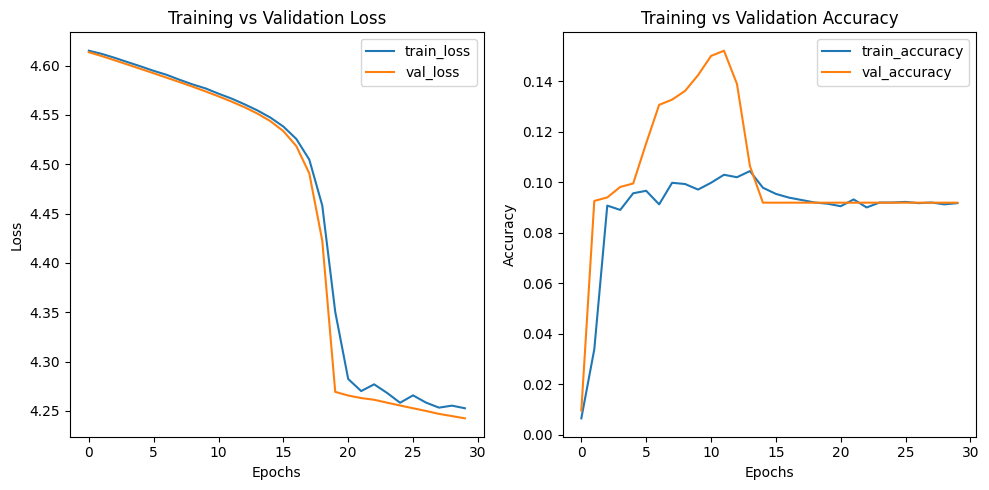

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 2

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 10
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet()
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.605672836303711
Training Accuracy: 0.059814453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.589857578277588
Validation Accuracy: 0.11687413554633472
- Starting epoch 2/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.569713115692139
Training Accuracy: 0.09033203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.54216194152832
Validation Accuracy: 0.09197786998616875
- Starting epoch 3/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.45125675201416
Training Accuracy: 0.09326171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.31732702255249
Validation Accuracy: 0.09197786998616875
- Starting epoch 4/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.246041297912598
Training Accuracy: 0.092529296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.2247796058654785
Validation Accuracy: 0.09474412171507607
- Starting epoch 5/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.201916217803955
Training Accuracy: 0.10107421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.1594557762146
Validation Accuracy: 0.09681881051175657
- Starting epoch 6/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.154036045074463
Training Accuracy: 0.11181640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.097350120544434
Validation Accuracy: 0.10857538035961273
- Starting epoch 7/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.080027103424072
Training Accuracy: 0.140869140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.048069477081299
Validation Accuracy: 0.18533886583679116
- Starting epoch 8/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.992974281311035
Training Accuracy: 0.18359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.8930246829986572
Validation Accuracy: 0.21300138312586445
- Starting epoch 9/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.8837199211120605
Training Accuracy: 0.20166015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.776238203048706
Validation Accuracy: 0.22268326417704012
- Starting epoch 10/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.7378995418548584
Training Accuracy: 0.2177734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.674884796142578
Validation Accuracy: 0.2206085753803596
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.6704206466674805
Training Accuracy: 0.218017578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.6248390674591064
Validation Accuracy: 0.22752420470262794
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.6232006549835205
Training Accuracy: 0.234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.5980751514434814
Validation Accuracy: 0.23029045643153526
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.6065046787261963
Training Accuracy: 0.238037109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.580488443374634
Validation Accuracy: 0.2351313969571231
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.595057964324951
Training Accuracy: 0.23193359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.5659875869750977
Validation Accuracy: 0.2330567081604426
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.5745115280151367
Training Accuracy: 0.239990234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.5501534938812256
Validation Accuracy: 0.23789764868603042
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.5584607124328613
Training Accuracy: 0.240234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.5301432609558105
Validation Accuracy: 0.23443983402489627
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.5393309593200684
Training Accuracy: 0.242431640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.516260862350464
Validation Accuracy: 0.2351313969571231
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.5175516605377197
Training Accuracy: 0.23974609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.505065679550171
Validation Accuracy: 0.2413554633471646
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4903810024261475
Training Accuracy: 0.25048828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4892659187316895
Validation Accuracy: 0.24481327800829875
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.489429235458374
Training Accuracy: 0.24609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4765372276306152
Validation Accuracy: 0.24688796680497926
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4851391315460205
Training Accuracy: 0.252197265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4661617279052734
Validation Accuracy: 0.24688796680497926
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.471177577972412
Training Accuracy: 0.2470703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4642159938812256
Validation Accuracy: 0.24688796680497926
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4701902866363525
Training Accuracy: 0.254638671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4618611335754395
Validation Accuracy: 0.2475795297372061
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.465102195739746
Training Accuracy: 0.252685546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4598960876464844
Validation Accuracy: 0.24827109266943292
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.459777355194092
Training Accuracy: 0.2529296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.458850622177124
Validation Accuracy: 0.24965421853388658
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4521632194519043
Training Accuracy: 0.256103515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.457113027572632
Validation Accuracy: 0.2503457814661134
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.448049545288086
Training Accuracy: 0.256591796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.456221580505371
Validation Accuracy: 0.24965421853388658
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4720354080200195
Training Accuracy: 0.25537109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4539453983306885
Validation Accuracy: 0.2503457814661134
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.460953950881958
Training Accuracy: 0.255859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.4532418251037598
Validation Accuracy: 0.2503457814661134
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4416799545288086
Training Accuracy: 0.258056640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.451470375061035
Validation Accuracy: 0.25103734439834025


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 3.931741237640381
Test Accuracy: 0.25475285171102663


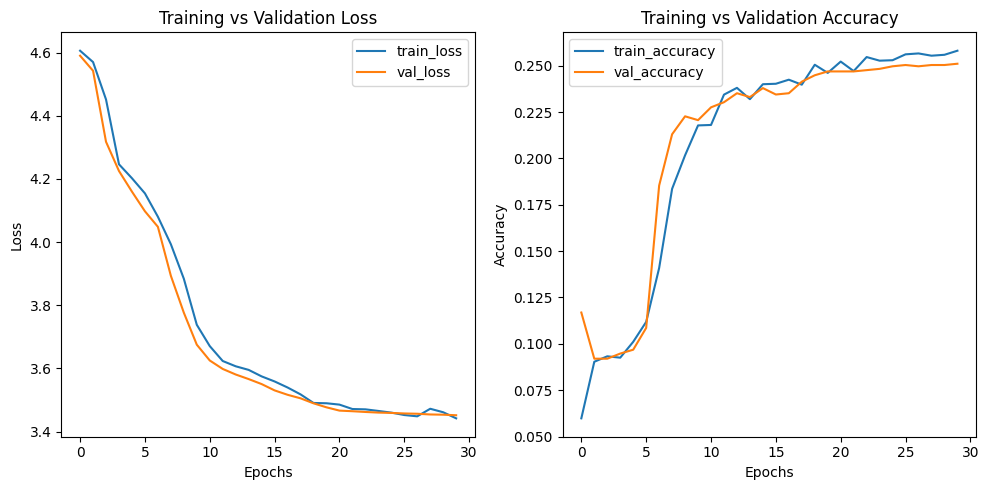

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 3

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 512

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 45
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet()
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.61171293258667
Training Accuracy: 0.03662109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.6061248779296875
Validation Accuracy: 0.09197786998616875
- Starting epoch 2/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.5995049476623535
Training Accuracy: 0.0927734375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.589838981628418
Validation Accuracy: 0.09197786998616875
- Starting epoch 3/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.581484317779541
Training Accuracy: 0.092529296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.569751262664795
Validation Accuracy: 0.09197786998616875
- Starting epoch 4/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.560432434082031
Training Accuracy: 0.09130859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.546087265014648
Validation Accuracy: 0.09197786998616875
- Starting epoch 5/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.532562732696533
Training Accuracy: 0.091796875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.511000156402588
Validation Accuracy: 0.09197786998616875
- Starting epoch 6/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.469215393066406
Training Accuracy: 0.09326171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.3752970695495605
Validation Accuracy: 0.09197786998616875
- Starting epoch 7/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.306169033050537
Training Accuracy: 0.0927734375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.300307750701904
Validation Accuracy: 0.09266943291839558
- Starting epoch 8/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.26812219619751
Training Accuracy: 0.099609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.215116024017334
Validation Accuracy: 0.10235131396957123
- Starting epoch 9/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.212140083312988
Training Accuracy: 0.094482421875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.1964640617370605
Validation Accuracy: 0.09197786998616875
- Starting epoch 10/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.202003479003906
Training Accuracy: 0.09912109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.177578926086426
Validation Accuracy: 0.09266943291839558
- Starting epoch 11/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.163397789001465
Training Accuracy: 0.1083984375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.155179500579834
Validation Accuracy: 0.09612724757952974
- Starting epoch 12/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.157836437225342
Training Accuracy: 0.099853515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.1213483810424805
Validation Accuracy: 0.14522821576763487
- Starting epoch 13/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.118080139160156
Training Accuracy: 0.12939453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.079689025878906
Validation Accuracy: 0.14522821576763487
- Starting epoch 14/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.075390338897705
Training Accuracy: 0.143310546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.0385966300964355
Validation Accuracy: 0.15975103734439833
- Starting epoch 15/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.01955509185791
Training Accuracy: 0.155517578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.9942431449890137
Validation Accuracy: 0.19432918395573998
- Starting epoch 16/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.9772133827209473
Training Accuracy: 0.17626953125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.956998825073242
Validation Accuracy: 0.20608575380359612
- Starting epoch 17/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.9231607913970947
Training Accuracy: 0.19970703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.8826680183410645
Validation Accuracy: 0.2095435684647303
- Starting epoch 18/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.8577826023101807
Training Accuracy: 0.206298828125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.7894387245178223
Validation Accuracy: 0.2143845089903181
- Starting epoch 19/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.774883270263672
Training Accuracy: 0.21484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.6892409324645996
Validation Accuracy: 0.23029045643153526
- Starting epoch 20/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.712130069732666
Training Accuracy: 0.214599609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.6312167644500732
Validation Accuracy: 0.23167358229598894
- Starting epoch 21/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.6394636631011963
Training Accuracy: 0.229248046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.618042469024658
Validation Accuracy: 0.2289073305670816
- Starting epoch 22/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.6197805404663086
Training Accuracy: 0.232421875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.6095566749572754
Validation Accuracy: 0.22821576763485477
- Starting epoch 23/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.628009796142578
Training Accuracy: 0.2294921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.6035990715026855
Validation Accuracy: 0.23029045643153526
- Starting epoch 24/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.6074838638305664
Training Accuracy: 0.23388671875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.590467929840088
Validation Accuracy: 0.22752420470262794
- Starting epoch 25/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.6021370887756348
Training Accuracy: 0.23486328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.5849967002868652
Validation Accuracy: 0.23029045643153526
- Starting epoch 26/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.598794937133789
Training Accuracy: 0.23193359375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.572680711746216
Validation Accuracy: 0.22821576763485477
- Starting epoch 27/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5832743644714355
Training Accuracy: 0.234130859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.567378282546997
Validation Accuracy: 0.22959889349930843
- Starting epoch 28/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.57574725151062
Training Accuracy: 0.2392578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.559828042984009
Validation Accuracy: 0.23098201936376211
- Starting epoch 29/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5610835552215576
Training Accuracy: 0.2353515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.548091173171997
Validation Accuracy: 0.23167358229598894
- Starting epoch 30/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5586953163146973
Training Accuracy: 0.236328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.5409374237060547
Validation Accuracy: 0.23167358229598894
- Starting epoch 31/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.552426815032959
Training Accuracy: 0.23779296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.5292205810546875
Validation Accuracy: 0.23443983402489627
- Starting epoch 32/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5472519397735596
Training Accuracy: 0.239990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.524174451828003
Validation Accuracy: 0.23582295988934993
- Starting epoch 33/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5493385791778564
Training Accuracy: 0.237060546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.512345552444458
Validation Accuracy: 0.23858921161825727
- Starting epoch 34/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.516456365585327
Training Accuracy: 0.23974609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.5078601837158203
Validation Accuracy: 0.2392807745504841
- Starting epoch 35/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.5218076705932617
Training Accuracy: 0.24365234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4963343143463135
Validation Accuracy: 0.24343015214384509
- Starting epoch 36/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.512805461883545
Training Accuracy: 0.24658203125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4919161796569824
Validation Accuracy: 0.24481327800829875
- Starting epoch 37/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.496051788330078
Training Accuracy: 0.244873046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.478492021560669
Validation Accuracy: 0.24619640387275243
- Starting epoch 38/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4891722202301025
Training Accuracy: 0.2470703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4735090732574463
Validation Accuracy: 0.24550484094052558
- Starting epoch 39/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4921927452087402
Training Accuracy: 0.247314453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4683115482330322
Validation Accuracy: 0.24827109266943292
- Starting epoch 40/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4738526344299316
Training Accuracy: 0.24951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4567813873291016
Validation Accuracy: 0.2517289073305671
- Starting epoch 41/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4575300216674805
Training Accuracy: 0.25


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.457268714904785
Validation Accuracy: 0.25103734439834025
- Starting epoch 42/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4570116996765137
Training Accuracy: 0.254150390625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.455652952194214
Validation Accuracy: 0.2503457814661134
- Starting epoch 43/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4580729007720947
Training Accuracy: 0.252685546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4562323093414307
Validation Accuracy: 0.25103734439834025
- Starting epoch 44/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4551448822021484
Training Accuracy: 0.25341796875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4547672271728516
Validation Accuracy: 0.25103734439834025
- Starting epoch 45/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4479527473449707
Training Accuracy: 0.253662109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.4526171684265137
Validation Accuracy: 0.2503457814661134


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/6 [00:00<?, ?it/s]

Test Loss: 3.9670681953430176
Test Accuracy: 0.2595921189077083


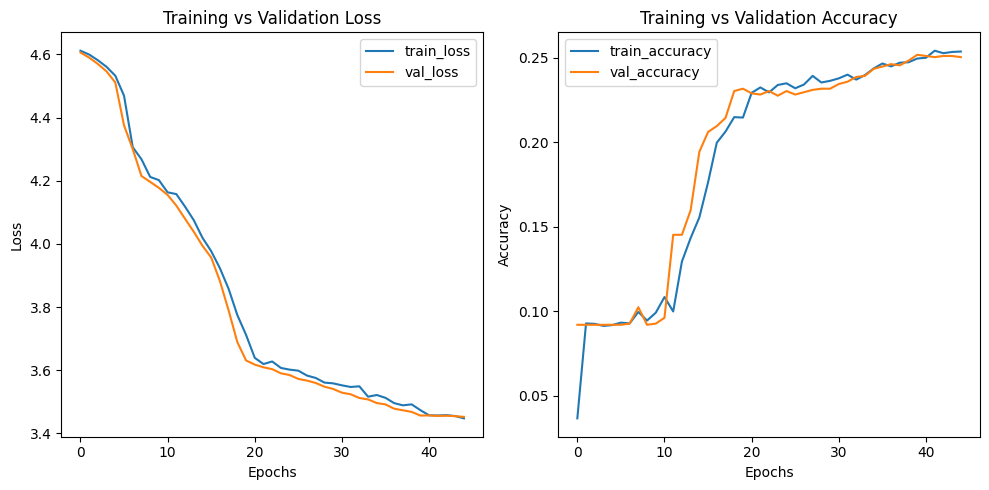

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

# Step 3: Transfer Learning

## Training 1

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 156MB/s]


- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.835963249206543
Training Accuracy: 0.202392578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.933671712875366
Validation Accuracy: 0.34716459197787
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.543273687362671
Training Accuracy: 0.4521484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.036957025527954
Validation Accuracy: 0.5477178423236515
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.598586082458496
Training Accuracy: 0.6259765625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.1846154928207397
Validation Accuracy: 0.7233748271092669
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.9434033632278442
Training Accuracy: 0.756103515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8243291974067688
Validation Accuracy: 0.7918395573997233
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.6132482290267944
Training Accuracy: 0.824951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.698255181312561
Validation Accuracy: 0.8195020746887967
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4515778422355652
Training Accuracy: 0.87158203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6544584035873413
Validation Accuracy: 0.830567081604426
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3599618971347809
Training Accuracy: 0.895263671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6185709834098816
Validation Accuracy: 0.838865836791148
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2943432033061981
Training Accuracy: 0.908447265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5873475074768066
Validation Accuracy: 0.8554633471645919
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.23671790957450867
Training Accuracy: 0.9345703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5900672078132629
Validation Accuracy: 0.8478561549100968
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.18299494683742523
Training Accuracy: 0.94921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5933394432067871
Validation Accuracy: 0.8423236514522822
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.17007052898406982
Training Accuracy: 0.949951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6087029576301575
Validation Accuracy: 0.851313969571231
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.15508906543254852
Training Accuracy: 0.95654296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5974296927452087
Validation Accuracy: 0.8526970954356846
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.12267833203077316
Training Accuracy: 0.968017578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.59529709815979
Validation Accuracy: 0.8540802213001383
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.10203273594379425
Training Accuracy: 0.972900390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6045700311660767
Validation Accuracy: 0.8506224066390041
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.09214449673891068
Training Accuracy: 0.976318359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6254434585571289
Validation Accuracy: 0.8506224066390041
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.08219972252845764
Training Accuracy: 0.978271484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6246564388275146
Validation Accuracy: 0.8499308437067773
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.07000244408845901
Training Accuracy: 0.98193359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6248593330383301
Validation Accuracy: 0.8575380359612724
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.07680794596672058
Training Accuracy: 0.978515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6424300074577332
Validation Accuracy: 0.8450899031811895
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.05948657914996147
Training Accuracy: 0.985107421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.627627968788147
Validation Accuracy: 0.8568464730290456
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.05502363294363022
Training Accuracy: 0.9853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6185101270675659
Validation Accuracy: 0.8609958506224067
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.04695233702659607
Training Accuracy: 0.986083984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6154838800430298
Validation Accuracy: 0.8609958506224067
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.04234686866402626
Training Accuracy: 0.990478515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6141381859779358
Validation Accuracy: 0.8609958506224067
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.038263920694589615
Training Accuracy: 0.99267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6168859004974365
Validation Accuracy: 0.8589211618257261
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03919583931565285
Training Accuracy: 0.989501953125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6178144216537476
Validation Accuracy: 0.8603042876901799
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03730599209666252
Training Accuracy: 0.9912109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.618773341178894
Validation Accuracy: 0.859612724757953
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.039299458265304565
Training Accuracy: 0.99072265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6183055639266968
Validation Accuracy: 0.8603042876901799
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.04010898992419243
Training Accuracy: 0.9921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6217882633209229
Validation Accuracy: 0.8540802213001383
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.039077602326869965
Training Accuracy: 0.989501953125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6216859817504883
Validation Accuracy: 0.8540802213001383
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03383893147110939
Training Accuracy: 0.993896484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6218186020851135
Validation Accuracy: 0.8582295988934993
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.039048343896865845
Training Accuracy: 0.99267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6223371028900146
Validation Accuracy: 0.8540802213001383


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.7187425494194031
Test Accuracy: 0.8157621845834774


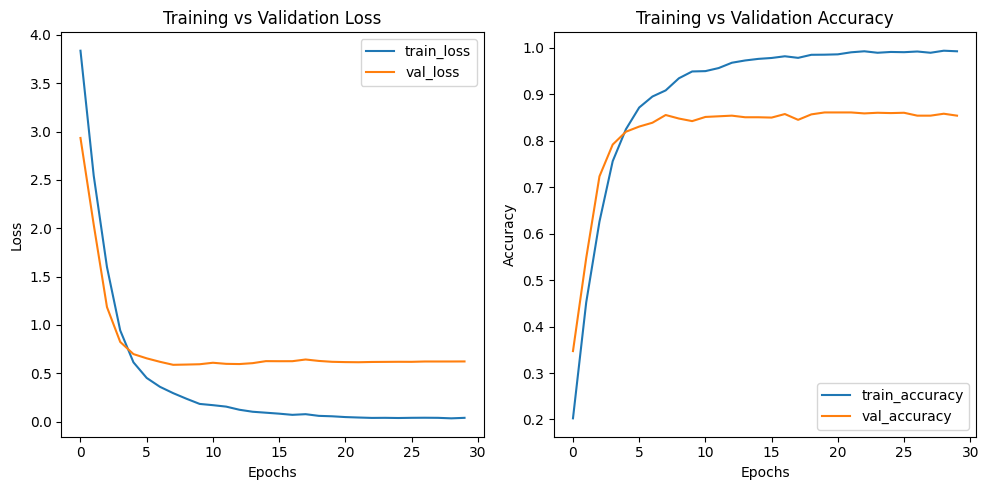

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 2

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 10
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.6292757987976074
Training Accuracy: 0.43017578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.1416730880737305
Validation Accuracy: 0.7130013831258645
- Starting epoch 2/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7462177276611328
Training Accuracy: 0.793701171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.791996419429779
Validation Accuracy: 0.7842323651452282
- Starting epoch 3/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3928349018096924
Training Accuracy: 0.89013671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6087560653686523
Validation Accuracy: 0.826417704011065
- Starting epoch 4/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.19008879363536835
Training Accuracy: 0.94140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5897600054740906
Validation Accuracy: 0.8464730290456431
- Starting epoch 5/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.11773215979337692
Training Accuracy: 0.96435546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5473411083221436
Validation Accuracy: 0.8603042876901799
- Starting epoch 6/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.07499830424785614
Training Accuracy: 0.97705078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5703939199447632
Validation Accuracy: 0.8582295988934993
- Starting epoch 7/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.07110480219125748
Training Accuracy: 0.9794921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5931664109230042
Validation Accuracy: 0.8499308437067773
- Starting epoch 8/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03954111039638519
Training Accuracy: 0.988525390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6401306390762329
Validation Accuracy: 0.8568464730290456
- Starting epoch 9/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.04373602569103241
Training Accuracy: 0.986328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6573579907417297
Validation Accuracy: 0.8526970954356846
- Starting epoch 10/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.031928300857543945
Training Accuracy: 0.99169921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6227983832359314
Validation Accuracy: 0.8589211618257261
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.016214119270443916
Training Accuracy: 0.99658203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.596399188041687
Validation Accuracy: 0.8706777316735823
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.011363524943590164
Training Accuracy: 0.99755859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.585327684879303
Validation Accuracy: 0.8775933609958506
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.009277942590415478
Training Accuracy: 0.99853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5798433423042297
Validation Accuracy: 0.8755186721991701
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.008140584453940392
Training Accuracy: 0.998046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5834493637084961
Validation Accuracy: 0.8748271092669433
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.006876726634800434
Training Accuracy: 0.9990234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5878931879997253
Validation Accuracy: 0.8741355463347165
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.006903012283146381
Training Accuracy: 0.99853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5910043716430664
Validation Accuracy: 0.8741355463347165
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.008903954178094864
Training Accuracy: 0.997314453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5905835628509521
Validation Accuracy: 0.8748271092669433
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.007720254827290773
Training Accuracy: 0.998779296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.590857982635498
Validation Accuracy: 0.876210235131397
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.007751327473670244
Training Accuracy: 0.998291015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5930417776107788
Validation Accuracy: 0.876210235131397
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.004968150518834591
Training Accuracy: 0.999267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5943371653556824
Validation Accuracy: 0.8734439834024896
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.00421259505674243
Training Accuracy: 0.999267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5944814085960388
Validation Accuracy: 0.8734439834024896
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.004910280462354422
Training Accuracy: 0.999267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5949404835700989
Validation Accuracy: 0.8741355463347165
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.006241947878152132
Training Accuracy: 0.998779296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.594993531703949
Validation Accuracy: 0.8741355463347165
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.003983149304986
Training Accuracy: 0.99951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5953529477119446
Validation Accuracy: 0.8748271092669433
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0066557759419083595
Training Accuracy: 0.998779296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5955774188041687
Validation Accuracy: 0.8734439834024896
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.005677139852195978
Training Accuracy: 0.9990234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5957990884780884
Validation Accuracy: 0.8734439834024896
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0061631957069039345
Training Accuracy: 0.998291015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5962167978286743
Validation Accuracy: 0.8734439834024896
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0053302752785384655
Training Accuracy: 0.998779296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.595986008644104
Validation Accuracy: 0.8734439834024896
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.004034589044749737
Training Accuracy: 0.999267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5961329936981201
Validation Accuracy: 0.8734439834024896
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0074227373115718365
Training Accuracy: 0.998291015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5963404774665833
Validation Accuracy: 0.8734439834024896


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.7253969311714172
Test Accuracy: 0.8268233667473212


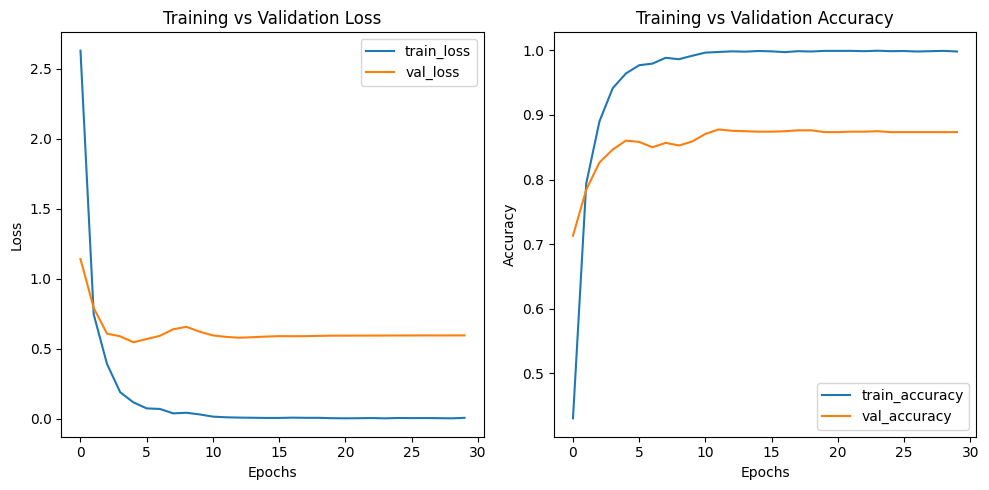

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 3

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 512

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 45
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.360598564147949
Training Accuracy: 0.2900390625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.150747537612915
Validation Accuracy: 0.5172890733056709
- Starting epoch 2/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 1.5270918607711792
Training Accuracy: 0.632080078125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.9262413382530212
Validation Accuracy: 0.7579529737206085
- Starting epoch 3/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.6772769689559937
Training Accuracy: 0.809814453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6765273213386536
Validation Accuracy: 0.8174273858921162
- Starting epoch 4/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.39402487874031067
Training Accuracy: 0.886474609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5744715332984924
Validation Accuracy: 0.838865836791148
- Starting epoch 5/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.2546054720878601
Training Accuracy: 0.92626953125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5801828503608704
Validation Accuracy: 0.8416320885200553
- Starting epoch 6/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Training Loss: 0.1611110121011734
Training Accuracy: 0.94970703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5907312035560608
Validation Accuracy: 0.84716459197787
- Starting epoch 7/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.10992938280105591
Training Accuracy: 0.966064453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5459867715835571
Validation Accuracy: 0.8554633471645919
- Starting epoch 8/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0729425698518753
Training Accuracy: 0.9794921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5285224318504333
Validation Accuracy: 0.8658367911479945
- Starting epoch 9/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.055158860981464386
Training Accuracy: 0.98193359375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.589987576007843
Validation Accuracy: 0.8623789764868603
- Starting epoch 10/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.056760724633932114
Training Accuracy: 0.982666015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5539624094963074
Validation Accuracy: 0.8575380359612724
- Starting epoch 11/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03757907450199127
Training Accuracy: 0.988037109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5600577592849731
Validation Accuracy: 0.8658367911479945
- Starting epoch 12/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.030540775507688522
Training Accuracy: 0.991455078125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5761927962303162
Validation Accuracy: 0.8658367911479945
- Starting epoch 13/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.019348038360476494
Training Accuracy: 0.99462890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6111273169517517
Validation Accuracy: 0.8686030428769018
- Starting epoch 14/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.021370716392993927
Training Accuracy: 0.993896484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6325090527534485
Validation Accuracy: 0.8589211618257261
- Starting epoch 15/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.021503515541553497
Training Accuracy: 0.99267578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6425031423568726
Validation Accuracy: 0.8561549100968188
- Starting epoch 16/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.01912856660783291
Training Accuracy: 0.994873046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6233319044113159
Validation Accuracy: 0.8672199170124482
- Starting epoch 17/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.01579459197819233
Training Accuracy: 0.995361328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6322017312049866
Validation Accuracy: 0.8589211618257261
- Starting epoch 18/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.013287843205034733
Training Accuracy: 0.9970703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6343436241149902
Validation Accuracy: 0.8623789764868603
- Starting epoch 19/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.013272575102746487
Training Accuracy: 0.99658203125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6254181265830994
Validation Accuracy: 0.8609958506224067
- Starting epoch 20/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.01191582903265953
Training Accuracy: 0.998291015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6280504465103149
Validation Accuracy: 0.8623789764868603
- Starting epoch 21/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.007194639183580875
Training Accuracy: 0.99853515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6231955289840698
Validation Accuracy: 0.8644536652835408
- Starting epoch 22/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.011223227716982365
Training Accuracy: 0.997314453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6157128810882568
Validation Accuracy: 0.867911479944675
- Starting epoch 23/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.008543206378817558
Training Accuracy: 0.99853515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6106290817260742
Validation Accuracy: 0.8706777316735823
- Starting epoch 24/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.007128125987946987
Training Accuracy: 0.998779296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.607110321521759
Validation Accuracy: 0.8706777316735823
- Starting epoch 25/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.008383017964661121
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6055611968040466
Validation Accuracy: 0.8727524204702628
- Starting epoch 26/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0059731341898441315
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6056175231933594
Validation Accuracy: 0.8734439834024896
- Starting epoch 27/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004320782609283924
Training Accuracy: 0.999267578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6079185009002686
Validation Accuracy: 0.8727524204702628
- Starting epoch 28/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.006877961102873087
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6083119511604309
Validation Accuracy: 0.872060857538036
- Starting epoch 29/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004798206500709057
Training Accuracy: 0.999267578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6076605319976807
Validation Accuracy: 0.872060857538036
- Starting epoch 30/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0038731428794562817
Training Accuracy: 0.99951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6077932715415955
Validation Accuracy: 0.872060857538036
- Starting epoch 31/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0058545880019664764
Training Accuracy: 0.998291015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6080200672149658
Validation Accuracy: 0.8727524204702628
- Starting epoch 32/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.00575762614607811
Training Accuracy: 0.998779296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6076030731201172
Validation Accuracy: 0.8727524204702628
- Starting epoch 33/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004665755201131105
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.608154833316803
Validation Accuracy: 0.8727524204702628
- Starting epoch 34/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.007146745454519987
Training Accuracy: 0.998046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6073793172836304
Validation Accuracy: 0.8741355463347165
- Starting epoch 35/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004069511312991381
Training Accuracy: 0.999755859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6069047451019287
Validation Accuracy: 0.8727524204702628
- Starting epoch 36/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.005038612987846136
Training Accuracy: 0.998291015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6065288782119751
Validation Accuracy: 0.8734439834024896
- Starting epoch 37/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004890239331871271
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6061416268348694
Validation Accuracy: 0.8769017980636238
- Starting epoch 38/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004934371914714575
Training Accuracy: 0.9990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.607778787612915
Validation Accuracy: 0.8755186721991701
- Starting epoch 39/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004342656582593918
Training Accuracy: 0.998779296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6094626188278198
Validation Accuracy: 0.8755186721991701
- Starting epoch 40/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004380145575851202
Training Accuracy: 0.99951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6105346083641052
Validation Accuracy: 0.8727524204702628
- Starting epoch 41/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.005303423851728439
Training Accuracy: 0.99853515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6105257272720337
Validation Accuracy: 0.8727524204702628
- Starting epoch 42/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004002556670457125
Training Accuracy: 0.999267578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6103633642196655
Validation Accuracy: 0.8727524204702628
- Starting epoch 43/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004590238444507122
Training Accuracy: 0.998779296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6103606820106506
Validation Accuracy: 0.8727524204702628
- Starting epoch 44/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.005435580387711525
Training Accuracy: 0.99853515625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6103111505508423
Validation Accuracy: 0.8727524204702628
- Starting epoch 45/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.004048910923302174
Training Accuracy: 0.999267578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6100658178329468
Validation Accuracy: 0.8727524204702628


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/6 [00:00<?, ?it/s]

Test Loss: 0.6763986349105835
Test Accuracy: 0.8261320428620809


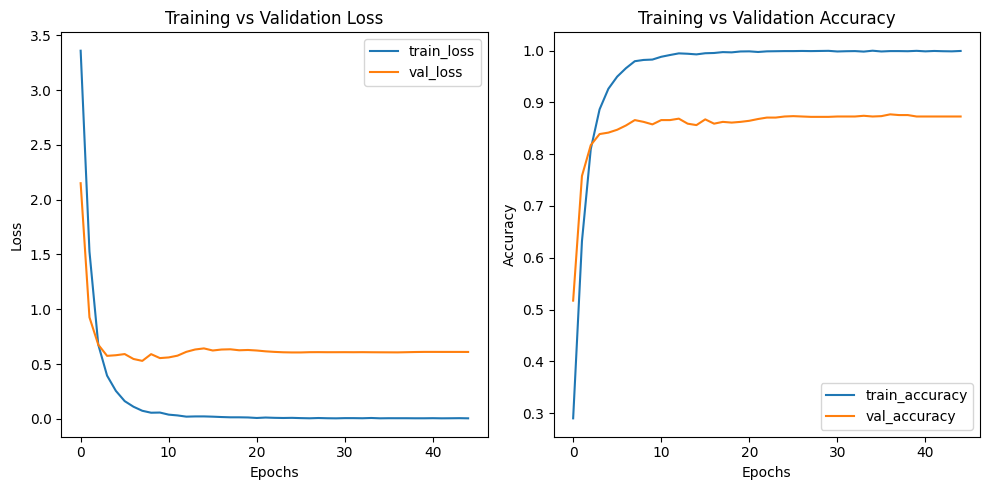

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 1: Freeze convolutional layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.8501691818237305
Training Accuracy: 0.200927734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.9257800579071045
Validation Accuracy: 0.3437067773167358
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.5209600925445557
Training Accuracy: 0.4482421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.1205594539642334
Validation Accuracy: 0.5594744121715076
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.8453210592269897
Training Accuracy: 0.615478515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.6323144435882568
Validation Accuracy: 0.6673582295988935
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.4097988605499268
Training Accuracy: 0.70361328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.3161051273345947
Validation Accuracy: 0.7309820193637621
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.1357353925704956
Training Accuracy: 0.76171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.1337482929229736
Validation Accuracy: 0.7648686030428768
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.947053074836731
Training Accuracy: 0.80078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.9755198359489441
Validation Accuracy: 0.7814661134163209
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.808141827583313
Training Accuracy: 0.823486328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8830038905143738
Validation Accuracy: 0.8042876901798064
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7078450322151184
Training Accuracy: 0.84033203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8244162201881409
Validation Accuracy: 0.7994467496542186
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.6322731375694275
Training Accuracy: 0.85791015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7909287214279175
Validation Accuracy: 0.80567081604426
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.5667396187782288
Training Accuracy: 0.87109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7460921406745911
Validation Accuracy: 0.8160442600276625
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.5286663174629211
Training Accuracy: 0.876953125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7047338485717773
Validation Accuracy: 0.8167358229598893
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.47853007912635803
Training Accuracy: 0.88671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6565427184104919
Validation Accuracy: 0.8367911479944675
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4380972683429718
Training Accuracy: 0.899658203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6665440201759338
Validation Accuracy: 0.8278008298755186
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.42521920800209045
Training Accuracy: 0.897705078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6169430613517761
Validation Accuracy: 0.8236514522821576
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3729744255542755
Training Accuracy: 0.909423828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6398005485534668
Validation Accuracy: 0.8250345781466113
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.34734466671943665
Training Accuracy: 0.918701171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5881696939468384
Validation Accuracy: 0.8423236514522822
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.34499216079711914
Training Accuracy: 0.92138671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5918611288070679
Validation Accuracy: 0.843015214384509
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3228234350681305
Training Accuracy: 0.918701171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5765673518180847
Validation Accuracy: 0.843015214384509
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3081374764442444
Training Accuracy: 0.924560546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5880995988845825
Validation Accuracy: 0.8360995850622407
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2728131413459778
Training Accuracy: 0.93896484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5766588449478149
Validation Accuracy: 0.8443983402489627
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.28004834055900574
Training Accuracy: 0.935302734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5703601837158203
Validation Accuracy: 0.8354080221300139
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2692522406578064
Training Accuracy: 0.93994140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5613881349563599
Validation Accuracy: 0.8464730290456431
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.26259228587150574
Training Accuracy: 0.94140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5622904896736145
Validation Accuracy: 0.8409405255878285
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2616438865661621
Training Accuracy: 0.940185546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5827417969703674
Validation Accuracy: 0.8506224066390041
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2635001242160797
Training Accuracy: 0.940673828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5794229507446289
Validation Accuracy: 0.8492392807745505
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.25591030716896057
Training Accuracy: 0.9482421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5831243991851807
Validation Accuracy: 0.8367911479944675
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2585195004940033
Training Accuracy: 0.937255859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5607731342315674
Validation Accuracy: 0.8423236514522822
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.26377177238464355
Training Accuracy: 0.939208984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5754905939102173
Validation Accuracy: 0.8374827109266944
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.24949349462985992
Training Accuracy: 0.94384765625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5828372240066528
Validation Accuracy: 0.8402489626556017
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2599587142467499
Training Accuracy: 0.94091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5789024233818054
Validation Accuracy: 0.8464730290456431


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.5273347496986389
Test Accuracy: 0.8489457310750086


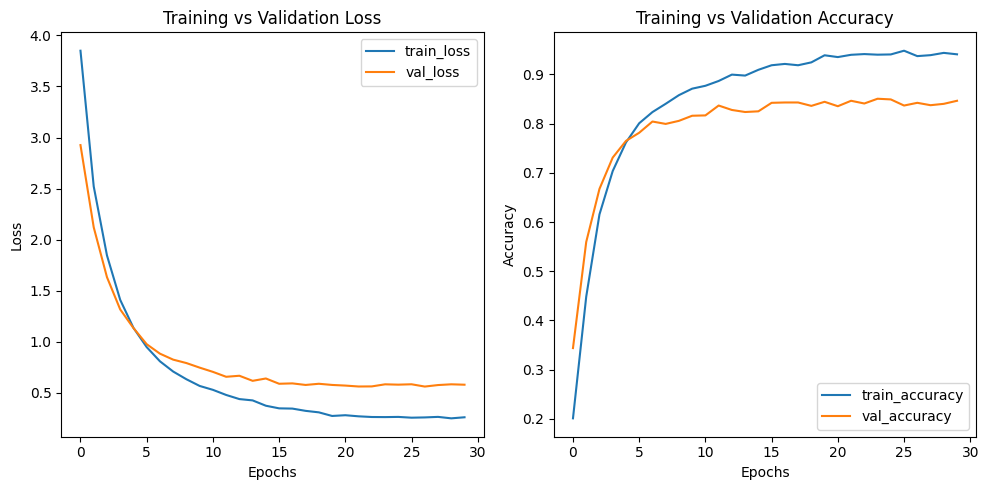

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 1: Freeze classifier layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.features.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.86393404006958
Training Accuracy: 0.005615234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.687067985534668
Validation Accuracy: 0.009681881051175657
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.618503570556641
Training Accuracy: 0.02783203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.506411075592041
Validation Accuracy: 0.06639004149377593
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.464727878570557
Training Accuracy: 0.07470703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.368176460266113
Validation Accuracy: 0.1396957123098202
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.335092067718506
Training Accuracy: 0.1396484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.225327491760254
Validation Accuracy: 0.17565698478561548
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.201419830322266
Training Accuracy: 0.16064453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 4.06090784072876
Validation Accuracy: 0.21023513139695713
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.076563358306885
Training Accuracy: 0.196533203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.8911514282226562
Validation Accuracy: 0.2392807745504841
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.917419672012329
Training Accuracy: 0.219482421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.740462064743042
Validation Accuracy: 0.24204702627939143
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.766385793685913
Training Accuracy: 0.231689453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.6187362670898438
Validation Accuracy: 0.24066390041493776
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.6708590984344482
Training Accuracy: 0.2451171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.5330307483673096
Validation Accuracy: 0.25587828492392806
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.586578369140625
Training Accuracy: 0.25146484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.456272602081299
Validation Accuracy: 0.26832641770401106
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.506948709487915
Training Accuracy: 0.265869140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.386381149291992
Validation Accuracy: 0.2869986168741355
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.426934242248535
Training Accuracy: 0.27880859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.326482057571411
Validation Accuracy: 0.30428769017980634
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.407627582550049
Training Accuracy: 0.282958984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.277520179748535
Validation Accuracy: 0.31742738589211617
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.3334403038024902
Training Accuracy: 0.297119140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.229374647140503
Validation Accuracy: 0.33402489626556015
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.2899577617645264
Training Accuracy: 0.30615234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.187314987182617
Validation Accuracy: 0.34232365145228216
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.240844249725342
Training Accuracy: 0.315673828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.147919178009033
Validation Accuracy: 0.3478561549100968
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.2056989669799805
Training Accuracy: 0.320556640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.1206140518188477
Validation Accuracy: 0.359612724757953
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.1570608615875244
Training Accuracy: 0.33984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0961525440216064
Validation Accuracy: 0.355463347164592
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.139857530593872
Training Accuracy: 0.33740234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0564165115356445
Validation Accuracy: 0.367911479944675
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.098417282104492
Training Accuracy: 0.349853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.023456573486328
Validation Accuracy: 0.3748271092669433
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0804903507232666
Training Accuracy: 0.350341796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0178041458129883
Validation Accuracy: 0.3769017980636238
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.057760238647461
Training Accuracy: 0.355224609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0147488117218018
Validation Accuracy: 0.3755186721991701
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0727291107177734
Training Accuracy: 0.356689453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.013864040374756
Validation Accuracy: 0.3789764868603043
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0561606884002686
Training Accuracy: 0.352294921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0093305110931396
Validation Accuracy: 0.3755186721991701
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0481717586517334
Training Accuracy: 0.352294921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.005779981613159
Validation Accuracy: 0.37621023513139695
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.065084218978882
Training Accuracy: 0.346923828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.003790855407715
Validation Accuracy: 0.3748271092669433
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0627293586730957
Training Accuracy: 0.3505859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.0002384185791016
Validation Accuracy: 0.3789764868603043
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0369465351104736
Training Accuracy: 0.357666015625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.9977715015411377
Validation Accuracy: 0.38105117565698476
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.057873010635376
Training Accuracy: 0.353515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.994222640991211
Validation Accuracy: 0.38381742738589214
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.0485734939575195
Training Accuracy: 0.35107421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.991194009780884
Validation Accuracy: 0.38381742738589214


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 3.122497320175171
Test Accuracy: 0.34600760456273766


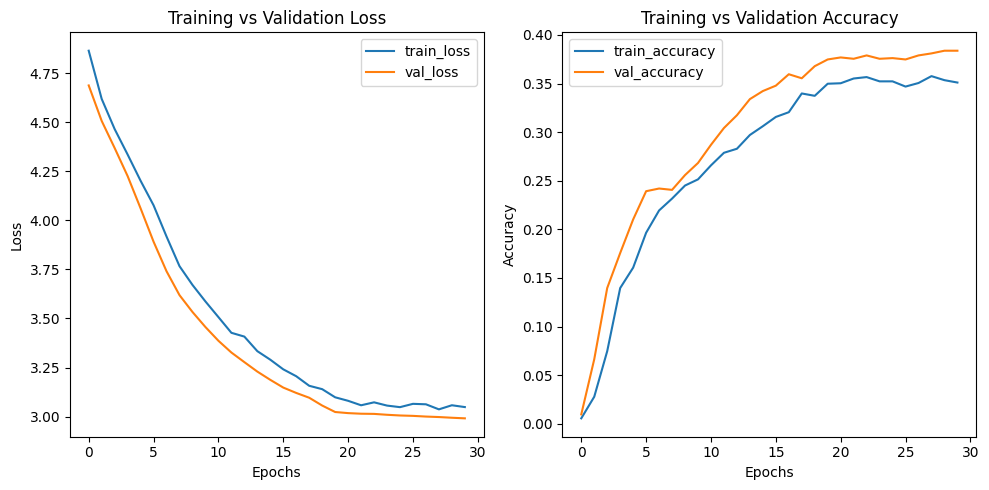

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 2: Freeze convolutional layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 10
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.5318448543548584
Training Accuracy: 0.454345703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.0955370664596558
Validation Accuracy: 0.7247579529737206
- Starting epoch 2/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7169895172119141
Training Accuracy: 0.813720703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6566461324691772
Validation Accuracy: 0.8250345781466113
- Starting epoch 3/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3672601282596588
Training Accuracy: 0.897705078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5517676472663879
Validation Accuracy: 0.8526970954356846
- Starting epoch 4/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2293279469013214
Training Accuracy: 0.939453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5155185461044312
Validation Accuracy: 0.859612724757953
- Starting epoch 5/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.14978648722171783
Training Accuracy: 0.9609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5383036732673645
Validation Accuracy: 0.8554633471645919
- Starting epoch 6/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.11334528774023056
Training Accuracy: 0.9736328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.51411372423172
Validation Accuracy: 0.8623789764868603
- Starting epoch 7/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.08918561041355133
Training Accuracy: 0.97900390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5178799629211426
Validation Accuracy: 0.8672199170124482
- Starting epoch 8/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.07659053057432175
Training Accuracy: 0.985107421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5182399749755859
Validation Accuracy: 0.8665283540802213
- Starting epoch 9/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.05907212942838669
Training Accuracy: 0.986572265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5688894391059875
Validation Accuracy: 0.8478561549100968
- Starting epoch 10/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.06137502193450928
Training Accuracy: 0.9853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5419965982437134
Validation Accuracy: 0.8630705394190872
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.05767083168029785
Training Accuracy: 0.9853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5125640630722046
Validation Accuracy: 0.8713692946058091
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03924483433365822
Training Accuracy: 0.992919921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5079783201217651
Validation Accuracy: 0.8734439834024896
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.04170704632997513
Training Accuracy: 0.992431640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5047333836555481
Validation Accuracy: 0.8741355463347165
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03856156766414642
Training Accuracy: 0.9951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5048930048942566
Validation Accuracy: 0.8741355463347165
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03713126853108406
Training Accuracy: 0.99365234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5026764273643494
Validation Accuracy: 0.8741355463347165
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.033247124403715134
Training Accuracy: 0.995361328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.502048134803772
Validation Accuracy: 0.876210235131397
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03589420020580292
Training Accuracy: 0.992919921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5022895336151123
Validation Accuracy: 0.8734439834024896
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.035963185131549835
Training Accuracy: 0.992919921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.503743052482605
Validation Accuracy: 0.8734439834024896
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03239366412162781
Training Accuracy: 0.99462890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5029920339584351
Validation Accuracy: 0.8748271092669433
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03426742181181908
Training Accuracy: 0.993896484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5031628608703613
Validation Accuracy: 0.8755186721991701
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03083953447639942
Training Accuracy: 0.996337890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5030768513679504
Validation Accuracy: 0.8741355463347165
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.033143237233161926
Training Accuracy: 0.994873046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5030061602592468
Validation Accuracy: 0.8755186721991701
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.03354883939027786
Training Accuracy: 0.994873046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5030913949012756
Validation Accuracy: 0.8748271092669433
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0351237878203392
Training Accuracy: 0.994873046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5030126571655273
Validation Accuracy: 0.8748271092669433
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.031649697571992874
Training Accuracy: 0.99609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5029550790786743
Validation Accuracy: 0.8748271092669433
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0322125107049942
Training Accuracy: 0.99365234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5028740167617798
Validation Accuracy: 0.8755186721991701
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.02887502871453762
Training Accuracy: 0.99609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.502804696559906
Validation Accuracy: 0.8741355463347165
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.02988108992576599
Training Accuracy: 0.99658203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5028108358383179
Validation Accuracy: 0.8741355463347165
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.032464299350976944
Training Accuracy: 0.996337890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5028077960014343
Validation Accuracy: 0.8748271092669433
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.0304675605148077
Training Accuracy: 0.996337890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5027185678482056
Validation Accuracy: 0.8741355463347165


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.6079998016357422
Test Accuracy: 0.8347735914275838


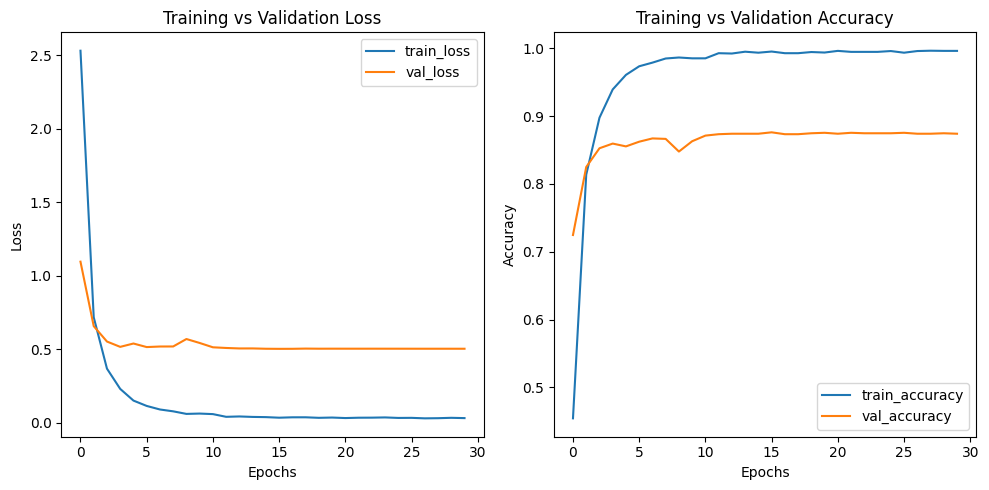

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 2: Freeze classifier layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 10
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.features.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


- Starting epoch 1/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 4.421658039093018
Training Accuracy: 0.093017578125


  0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation Loss: 3.940206527709961
Validation Accuracy: 0.23029045643153526
- Starting epoch 2/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.7405526638031006
Training Accuracy: 0.24169921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.449307918548584
Validation Accuracy: 0.25380359612724757
- Starting epoch 3/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.4153432846069336
Training Accuracy: 0.264404296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.274221658706665
Validation Accuracy: 0.29322268326417705
- Starting epoch 4/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.2302780151367188
Training Accuracy: 0.305908203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 3.105013608932495
Validation Accuracy: 0.338865836791148
- Starting epoch 5/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.064682960510254
Training Accuracy: 0.3388671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.972015380859375
Validation Accuracy: 0.3603042876901798
- Starting epoch 6/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.950927257537842
Training Accuracy: 0.356689453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.862159252166748
Validation Accuracy: 0.3831258644536653
- Starting epoch 7/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.8197832107543945
Training Accuracy: 0.39013671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.7828445434570312
Validation Accuracy: 0.39280774550484093
- Starting epoch 8/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.74454402923584
Training Accuracy: 0.407958984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.713926315307617
Validation Accuracy: 0.4190871369294606
- Starting epoch 9/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.6856188774108887
Training Accuracy: 0.412109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.620532512664795
Validation Accuracy: 0.4384508990318119
- Starting epoch 10/30, LR = [0.01]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.579514741897583
Training Accuracy: 0.434326171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.594668388366699
Validation Accuracy: 0.45919778699861685
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.4579830169677734
Training Accuracy: 0.459716796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.4683589935302734
Validation Accuracy: 0.46196403872752423
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.3707220554351807
Training Accuracy: 0.468994140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.4304800033569336
Validation Accuracy: 0.4723374827109267
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.3528354167938232
Training Accuracy: 0.47314453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.40841007232666
Validation Accuracy: 0.4806362378976487
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.3377673625946045
Training Accuracy: 0.4736328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.399013042449951
Validation Accuracy: 0.475103734439834
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.3237829208374023
Training Accuracy: 0.479248046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3850173950195312
Validation Accuracy: 0.48616874135546334
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2906241416931152
Training Accuracy: 0.483154296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3794143199920654
Validation Accuracy: 0.4806362378976487
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.274517774581909
Training Accuracy: 0.489501953125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.358812093734741
Validation Accuracy: 0.48893499308437066
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.264381170272827
Training Accuracy: 0.49267578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3438429832458496
Validation Accuracy: 0.49100968188105115
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.249432325363159
Training Accuracy: 0.493896484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.331125020980835
Validation Accuracy: 0.49377593360995853
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2379074096679688
Training Accuracy: 0.49853515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3361897468566895
Validation Accuracy: 0.491701244813278
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.215424060821533
Training Accuracy: 0.5078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.327343225479126
Validation Accuracy: 0.4979253112033195
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2104878425598145
Training Accuracy: 0.49951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3216521739959717
Validation Accuracy: 0.49930843706777317
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2237002849578857
Training Accuracy: 0.50244140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3186581134796143
Validation Accuracy: 0.49930843706777317
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.208739757537842
Training Accuracy: 0.500244140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.316622257232666
Validation Accuracy: 0.4972337482710927
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2268214225769043
Training Accuracy: 0.501220703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3162882328033447
Validation Accuracy: 0.4951590594744122
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.1964282989501953
Training Accuracy: 0.505859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3154489994049072
Validation Accuracy: 0.4972337482710927
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.21797513961792
Training Accuracy: 0.49951171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.313310384750366
Validation Accuracy: 0.495850622406639
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.224679470062256
Training Accuracy: 0.4970703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3105967044830322
Validation Accuracy: 0.4930843706777317
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.184267997741699
Training Accuracy: 0.505859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.309054136276245
Validation Accuracy: 0.49654218533886585
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.2235710620880127
Training Accuracy: 0.4990234375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.3089232444763184
Validation Accuracy: 0.5006915629322268


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 2.4772679805755615
Test Accuracy: 0.48461804355340476


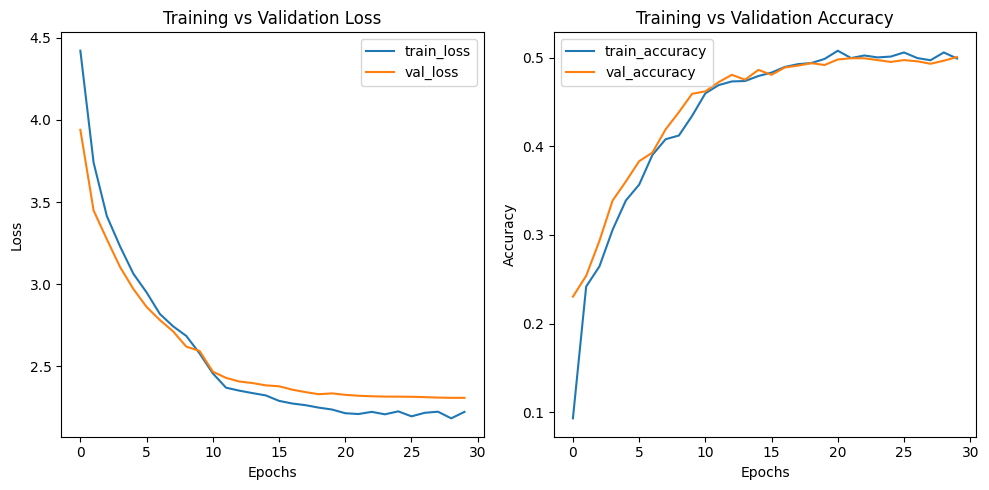

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 3: Freeze convolutional layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 512

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 45
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.34822940826416
Training Accuracy: 0.29443359375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.032571792602539
Validation Accuracy: 0.5373443983402489
- Starting epoch 2/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 1.500169277191162
Training Accuracy: 0.649169921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 1.0467207431793213
Validation Accuracy: 0.7572614107883817
- Starting epoch 3/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.7667838335037231
Training Accuracy: 0.8173828125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.707797646522522
Validation Accuracy: 0.8201936376210235
- Starting epoch 4/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.4714488983154297
Training Accuracy: 0.879638671875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.6168006062507629
Validation Accuracy: 0.8367911479944675
- Starting epoch 5/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.3394875228404999
Training Accuracy: 0.902587890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5608065128326416
Validation Accuracy: 0.8492392807745505
- Starting epoch 6/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.2643773853778839
Training Accuracy: 0.931884765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.535667359828949
Validation Accuracy: 0.8554633471645919
- Starting epoch 7/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.19490258395671844
Training Accuracy: 0.947021484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5368521213531494
Validation Accuracy: 0.8575380359612724
- Starting epoch 8/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.15469972789287567
Training Accuracy: 0.962646484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5266733765602112
Validation Accuracy: 0.8651452282157677
- Starting epoch 9/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.13574907183647156
Training Accuracy: 0.968017578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5263809561729431
Validation Accuracy: 0.859612724757953
- Starting epoch 10/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.11437743902206421
Training Accuracy: 0.97265625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5154478549957275
Validation Accuracy: 0.8665283540802213
- Starting epoch 11/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.09639189392328262
Training Accuracy: 0.98046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5295081734657288
Validation Accuracy: 0.8561549100968188
- Starting epoch 12/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0845312625169754
Training Accuracy: 0.98291015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5265976786613464
Validation Accuracy: 0.8672199170124482
- Starting epoch 13/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.075472392141819
Training Accuracy: 0.9873046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5321306586265564
Validation Accuracy: 0.8644536652835408
- Starting epoch 14/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.06713154911994934
Training Accuracy: 0.9892578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5243781805038452
Validation Accuracy: 0.867911479944675
- Starting epoch 15/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.06195073202252388
Training Accuracy: 0.9873046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5253415107727051
Validation Accuracy: 0.8686030428769018
- Starting epoch 16/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.05829141288995743
Training Accuracy: 0.989013671875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5322181582450867
Validation Accuracy: 0.8644536652835408
- Starting epoch 17/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.05187969654798508
Training Accuracy: 0.9921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5329172015190125
Validation Accuracy: 0.8665283540802213
- Starting epoch 18/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.04876038059592247
Training Accuracy: 0.9921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5285522937774658
Validation Accuracy: 0.872060857538036
- Starting epoch 19/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.045760612934827805
Training Accuracy: 0.992431640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5280055403709412
Validation Accuracy: 0.863762102351314
- Starting epoch 20/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0391487255692482
Training Accuracy: 0.993408203125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5289905071258545
Validation Accuracy: 0.863762102351314
- Starting epoch 21/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03838043287396431
Training Accuracy: 0.992919921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.528174102306366
Validation Accuracy: 0.863762102351314
- Starting epoch 22/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03451602905988693
Training Accuracy: 0.995361328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5268891453742981
Validation Accuracy: 0.8665283540802213
- Starting epoch 23/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03907237946987152
Training Accuracy: 0.9931640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5260899066925049
Validation Accuracy: 0.867911479944675
- Starting epoch 24/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03341580927371979
Training Accuracy: 0.99462890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5270061492919922
Validation Accuracy: 0.8686030428769018
- Starting epoch 25/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.037975866347551346
Training Accuracy: 0.99169921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5261295437812805
Validation Accuracy: 0.8692946058091287
- Starting epoch 26/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0345022939145565
Training Accuracy: 0.994140625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5251132249832153
Validation Accuracy: 0.8699861687413555
- Starting epoch 27/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03462747484445572
Training Accuracy: 0.99560546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5246602892875671
Validation Accuracy: 0.8706777316735823
- Starting epoch 28/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03442412614822388
Training Accuracy: 0.995361328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5242083072662354
Validation Accuracy: 0.8713692946058091
- Starting epoch 29/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03568894416093826
Training Accuracy: 0.99560546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5237699747085571
Validation Accuracy: 0.8713692946058091
- Starting epoch 30/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.035183995962142944
Training Accuracy: 0.995849609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5231814384460449
Validation Accuracy: 0.8713692946058091
- Starting epoch 31/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03185958415269852
Training Accuracy: 0.99560546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5227420926094055
Validation Accuracy: 0.8699861687413555
- Starting epoch 32/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.0350460410118103
Training Accuracy: 0.994873046875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5229739546775818
Validation Accuracy: 0.8706777316735823
- Starting epoch 33/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.033978093415498734
Training Accuracy: 0.9951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5230388641357422
Validation Accuracy: 0.8713692946058091
- Starting epoch 34/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03454465791583061
Training Accuracy: 0.994384765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5230592489242554
Validation Accuracy: 0.8713692946058091
- Starting epoch 35/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.035903479903936386
Training Accuracy: 0.99365234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.523622989654541
Validation Accuracy: 0.8692946058091287
- Starting epoch 36/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03300577029585838
Training Accuracy: 0.9951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5234028100967407
Validation Accuracy: 0.8699861687413555
- Starting epoch 37/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03378419950604439
Training Accuracy: 0.994384765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.52320796251297
Validation Accuracy: 0.8713692946058091
- Starting epoch 38/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03409738838672638
Training Accuracy: 0.99365234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5236034989356995
Validation Accuracy: 0.872060857538036
- Starting epoch 39/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.033352501690387726
Training Accuracy: 0.995361328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5237528085708618
Validation Accuracy: 0.8713692946058091
- Starting epoch 40/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03207135945558548
Training Accuracy: 0.995361328125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5239050984382629
Validation Accuracy: 0.8706777316735823
- Starting epoch 41/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.032904524356126785
Training Accuracy: 0.994384765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5238539576530457
Validation Accuracy: 0.8706777316735823
- Starting epoch 42/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.033066269010305405
Training Accuracy: 0.995849609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5238959193229675
Validation Accuracy: 0.8706777316735823
- Starting epoch 43/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.029494434595108032
Training Accuracy: 0.99609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.523838996887207
Validation Accuracy: 0.8713692946058091
- Starting epoch 44/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.032216235995292664
Training Accuracy: 0.994384765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.523781418800354
Validation Accuracy: 0.8713692946058091
- Starting epoch 45/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 0.03259068727493286
Training Accuracy: 0.9951171875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 0.5237745046615601
Validation Accuracy: 0.8713692946058091


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/6 [00:00<?, ?it/s]

Test Loss: 0.5766475796699524
Test Accuracy: 0.8389215347390252


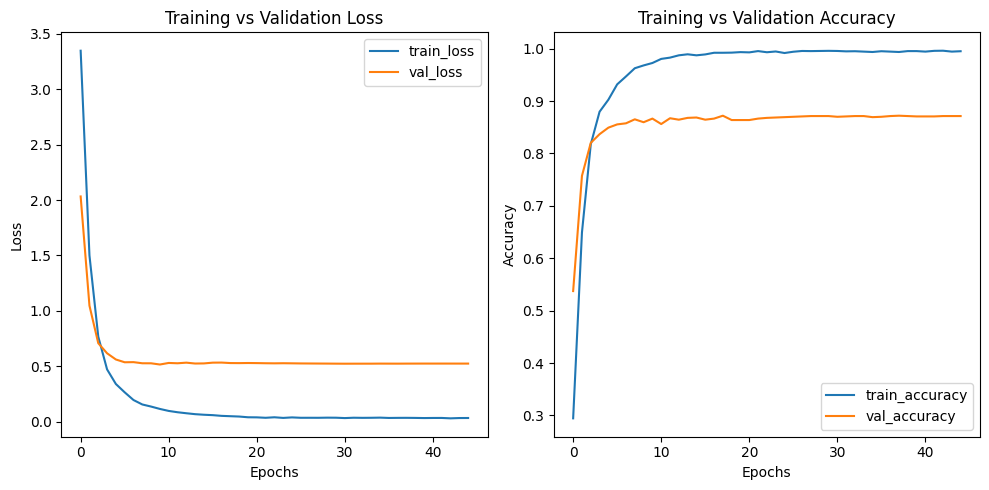

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

## Training 3: Freeze classifier layers

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 512

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 45
STEP_SIZE = 20
GAMMA = 0.1

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.features.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

- Starting epoch 1/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.684432029724121
Training Accuracy: 0.01513671875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.47584867477417
Validation Accuracy: 0.056016597510373446
- Starting epoch 2/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.371224880218506
Training Accuracy: 0.09765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 4.133457183837891
Validation Accuracy: 0.173582295988935
- Starting epoch 3/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 4.044294834136963
Training Accuracy: 0.194580078125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.7580678462982178
Validation Accuracy: 0.2475795297372061
- Starting epoch 4/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.709397077560425
Training Accuracy: 0.24072265625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.564288377761841
Validation Accuracy: 0.24481327800829875
- Starting epoch 5/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.4934184551239014
Training Accuracy: 0.264404296875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.3539998531341553
Validation Accuracy: 0.27247579529737204
- Starting epoch 6/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.3364098072052
Training Accuracy: 0.289794921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.235288381576538
Validation Accuracy: 0.3112033195020747
- Starting epoch 7/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.2049777507781982
Training Accuracy: 0.318359375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.123953342437744
Validation Accuracy: 0.35477178423236516
- Starting epoch 8/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.1087937355041504
Training Accuracy: 0.333740234375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 3.038527011871338
Validation Accuracy: 0.35892116182572614
- Starting epoch 9/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 3.00862193107605
Training Accuracy: 0.358642578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.9942240715026855
Validation Accuracy: 0.37344398340248963
- Starting epoch 10/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.9276156425476074
Training Accuracy: 0.3681640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.88983416557312
Validation Accuracy: 0.3900414937759336
- Starting epoch 11/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.8541436195373535
Training Accuracy: 0.390869140625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.8110616207122803
Validation Accuracy: 0.4066390041493776
- Starting epoch 12/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.776723861694336
Training Accuracy: 0.3984375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.7420995235443115
Validation Accuracy: 0.41839557399723376
- Starting epoch 13/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.7230923175811768
Training Accuracy: 0.418212890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.728835105895996
Validation Accuracy: 0.4017980636237898
- Starting epoch 14/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.6731948852539062
Training Accuracy: 0.423095703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.6797280311584473
Validation Accuracy: 0.43084370677731676
- Starting epoch 15/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.6045899391174316
Training Accuracy: 0.43505859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.590298652648926
Validation Accuracy: 0.4460580912863071
- Starting epoch 16/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.5248751640319824
Training Accuracy: 0.445556640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.544785737991333
Validation Accuracy: 0.4654218533886584
- Starting epoch 17/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.4718565940856934
Training Accuracy: 0.455810546875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.5036814212799072
Validation Accuracy: 0.4515905947441217
- Starting epoch 18/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.408439874649048
Training Accuracy: 0.465087890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.492452383041382
Validation Accuracy: 0.46749654218533887
- Starting epoch 19/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.3690848350524902
Training Accuracy: 0.475341796875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.3749661445617676
Validation Accuracy: 0.491701244813278
- Starting epoch 20/45, LR = [0.01]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.2905821800231934
Training Accuracy: 0.484130859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.3548929691314697
Validation Accuracy: 0.487551867219917
- Starting epoch 21/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.2185730934143066
Training Accuracy: 0.499755859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.3034112453460693
Validation Accuracy: 0.49239280774550487
- Starting epoch 22/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.18094801902771
Training Accuracy: 0.505859375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.290745973587036
Validation Accuracy: 0.5020746887966805
- Starting epoch 23/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.172193765640259
Training Accuracy: 0.50439453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.277801275253296
Validation Accuracy: 0.5020746887966805
- Starting epoch 24/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.159529209136963
Training Accuracy: 0.5087890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.2714858055114746
Validation Accuracy: 0.5048409405255878
- Starting epoch 25/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.137608528137207
Training Accuracy: 0.514892578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.2637062072753906
Validation Accuracy: 0.508298755186722
- Starting epoch 26/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.1274845600128174
Training Accuracy: 0.51806640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.255849599838257
Validation Accuracy: 0.5062240663900415
- Starting epoch 27/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.135413646697998
Training Accuracy: 0.5224609375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.252257823944092
Validation Accuracy: 0.5103734439834025
- Starting epoch 28/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.1338510513305664
Training Accuracy: 0.51416015625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.241159677505493
Validation Accuracy: 0.5159059474412172
- Starting epoch 29/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.098100185394287
Training Accuracy: 0.51953125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.238319158554077
Validation Accuracy: 0.5152143845089903
- Starting epoch 30/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.094741106033325
Training Accuracy: 0.525390625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.232736587524414
Validation Accuracy: 0.5076071922544951
- Starting epoch 31/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.099651336669922
Training Accuracy: 0.525146484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.226639747619629
Validation Accuracy: 0.5193637621023514
- Starting epoch 32/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0695242881774902
Training Accuracy: 0.527587890625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.217059373855591
Validation Accuracy: 0.5200553250345782
- Starting epoch 33/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.079923629760742
Training Accuracy: 0.5205078125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.217071056365967
Validation Accuracy: 0.5172890733056709
- Starting epoch 34/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.065359115600586
Training Accuracy: 0.53271484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.2149999141693115
Validation Accuracy: 0.5242047026279392
- Starting epoch 35/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.055086374282837
Training Accuracy: 0.530517578125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.208699941635132
Validation Accuracy: 0.5172890733056709
- Starting epoch 36/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0465352535247803
Training Accuracy: 0.53271484375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.2027668952941895
Validation Accuracy: 0.524896265560166
- Starting epoch 37/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0274271965026855
Training Accuracy: 0.537109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.2008581161499023
Validation Accuracy: 0.5235131396957123
- Starting epoch 38/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0309653282165527
Training Accuracy: 0.5302734375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.1927621364593506
Validation Accuracy: 0.5283540802213001
- Starting epoch 39/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.043412446975708
Training Accuracy: 0.532958984375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.1919562816619873
Validation Accuracy: 0.5269709543568465
- Starting epoch 40/45, LR = [0.001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0199873447418213
Training Accuracy: 0.539306640625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.1869471073150635
Validation Accuracy: 0.529045643153527
- Starting epoch 41/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.012808322906494
Training Accuracy: 0.541259765625


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.1848480701446533
Validation Accuracy: 0.5276625172890733
- Starting epoch 42/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.012054681777954
Training Accuracy: 0.537109375


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.182619571685791
Validation Accuracy: 0.5276625172890733
- Starting epoch 43/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.000236988067627
Training Accuracy: 0.5439453125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.180986166000366
Validation Accuracy: 0.5283540802213001
- Starting epoch 44/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0105738639831543
Training Accuracy: 0.54345703125


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.1793434619903564
Validation Accuracy: 0.5304287690179806
- Starting epoch 45/45, LR = [0.0001]


  0%|          | 0/8 [00:00<?, ?it/s]

Training Loss: 2.0242979526519775
Training Accuracy: 0.539794921875


  0%|          | 0/3 [00:00<?, ?it/s]

Validation Loss: 2.178567409515381
Validation Accuracy: 0.5338865836791148


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/6 [00:00<?, ?it/s]

Test Loss: 2.4429240226745605
Test Accuracy: 0.4898029726927065


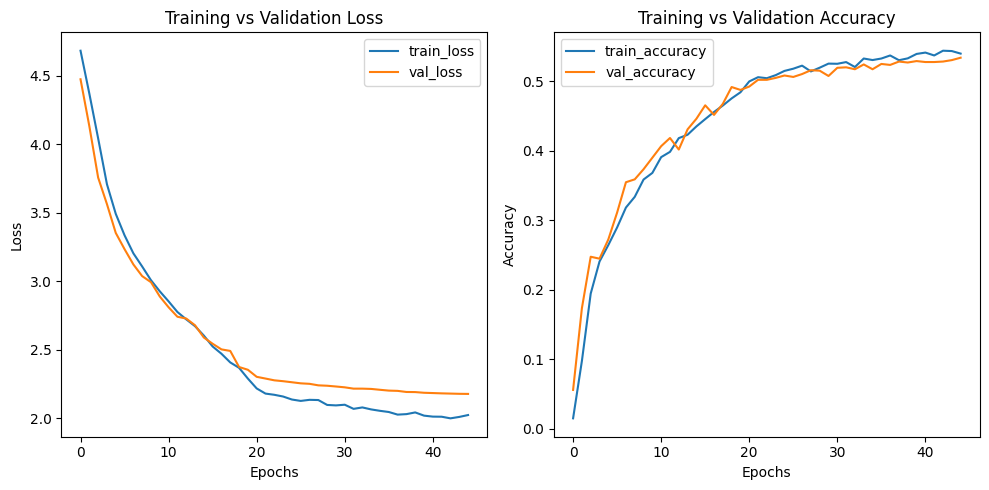

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

# Step 4: Transfer Learning

### Training 1: First set of transformations

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_transform = v2.Compose([v2.ToImage(),
                              v2.ToDtype(torch.uint8, scale=True),
                              v2.Resize(256, antialias=True),
                              v2.CenterCrop(224),
                              v2.RandomHorizontalFlip(p=0.5),
                              v2.RandomApply(nn.ModuleList([v2.ColorJitter(brightness=0.7, contrast=None, saturation=None, hue=None)]), p=0.5),
                              v2.ToDtype(torch.float32, scale=True),
                              v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])

# Define transforms for the evaluation phase
eval_transform = v2.Compose([v2.ToImage(),
                             v2.ToDtype(torch.uint8, scale=True),
                             v2.Resize(256, antialias=True),
                             v2.CenterCrop(224),
                             v2.ToDtype(torch.float32, scale=True),
                             v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = Caltech(DATA_DIR, split='train', transform=train_transform)
test_dataset = Caltech(DATA_DIR, split='test', transform=eval_transform)

train_indexes, val_indexes, _, _ = train_test_split(range(len(train_dataset)), train_dataset.labels, test_size=0.25, random_state=0, stratify=train_dataset.labels)

val_dataset = Subset(train_dataset, val_indexes)
train_dataset = Subset(train_dataset, train_indexes)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.873117446899414
Training Accuracy: 0.20703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.939060926437378
Validation Accuracy: 0.34923928077455046
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.4656832218170166
Training Accuracy: 0.4619140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.0631778240203857
Validation Accuracy: 0.5809128630705395
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.754583477973938
Training Accuracy: 0.62841796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.5734978914260864
Validation Accuracy: 0.6811894882434302
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.3116308450698853
Training Accuracy: 0.725341796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.2568730115890503
Validation Accuracy: 0.7455048409405256
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.0361967086791992
Training Accuracy: 0.787841796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.057438611984253
Validation Accuracy: 0.7821576763485477
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.8521527647972107
Training Accuracy: 0.8232421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.9204832911491394
Validation Accuracy: 0.8035961272475796
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7252786159515381
Training Accuracy: 0.84765625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8257778882980347
Validation Accuracy: 0.8195020746887967
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.6275845170021057
Training Accuracy: 0.861328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7516850233078003
Validation Accuracy: 0.8257261410788381
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.5465223789215088
Training Accuracy: 0.88330078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7083743214607239
Validation Accuracy: 0.8298755186721992
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4873623251914978
Training Accuracy: 0.892578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6764329671859741
Validation Accuracy: 0.8319502074688797
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.44545039534568787
Training Accuracy: 0.8974609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6124230623245239
Validation Accuracy: 0.8485477178423236
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.39350566267967224
Training Accuracy: 0.9091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6157214641571045
Validation Accuracy: 0.8409405255878285
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.36756595969200134
Training Accuracy: 0.91650390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5900039076805115
Validation Accuracy: 0.8450899031811895
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.34505194425582886
Training Accuracy: 0.925537109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5719589591026306
Validation Accuracy: 0.8450899031811895
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3152395486831665
Training Accuracy: 0.927978515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5582506060600281
Validation Accuracy: 0.8499308437067773
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2994846999645233
Training Accuracy: 0.93603515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5406258702278137
Validation Accuracy: 0.8609958506224067
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2637892961502075
Training Accuracy: 0.9443359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5459243059158325
Validation Accuracy: 0.8533886583679114
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2594398856163025
Training Accuracy: 0.94287109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.531217634677887
Validation Accuracy: 0.8526970954356846
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2452816665172577
Training Accuracy: 0.944091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5223752856254578
Validation Accuracy: 0.8540802213001383
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.23053139448165894
Training Accuracy: 0.94921875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.519767701625824
Validation Accuracy: 0.8589211618257261
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2128361314535141
Training Accuracy: 0.954833984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5187749266624451
Validation Accuracy: 0.859612724757953
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21985812485218048
Training Accuracy: 0.95556640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5193157196044922
Validation Accuracy: 0.8589211618257261
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2152574211359024
Training Accuracy: 0.951904296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.521653950214386
Validation Accuracy: 0.8651452282157677
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21445739269256592
Training Accuracy: 0.95654296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.531423807144165
Validation Accuracy: 0.8520055325034578
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21084977686405182
Training Accuracy: 0.9560546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5201022624969482
Validation Accuracy: 0.8609958506224067
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21112434566020966
Training Accuracy: 0.95849609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5112075805664062
Validation Accuracy: 0.8589211618257261
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20939555764198303
Training Accuracy: 0.956298828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5240058898925781
Validation Accuracy: 0.8686030428769018
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20500457286834717
Training Accuracy: 0.95556640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5337473750114441
Validation Accuracy: 0.8589211618257261
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2117774933576584
Training Accuracy: 0.955078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5124545097351074
Validation Accuracy: 0.8630705394190872
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20283637940883636
Training Accuracy: 0.955810546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5095493793487549
Validation Accuracy: 0.8630705394190872


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.5073390603065491
Test Accuracy: 0.8513653646733494


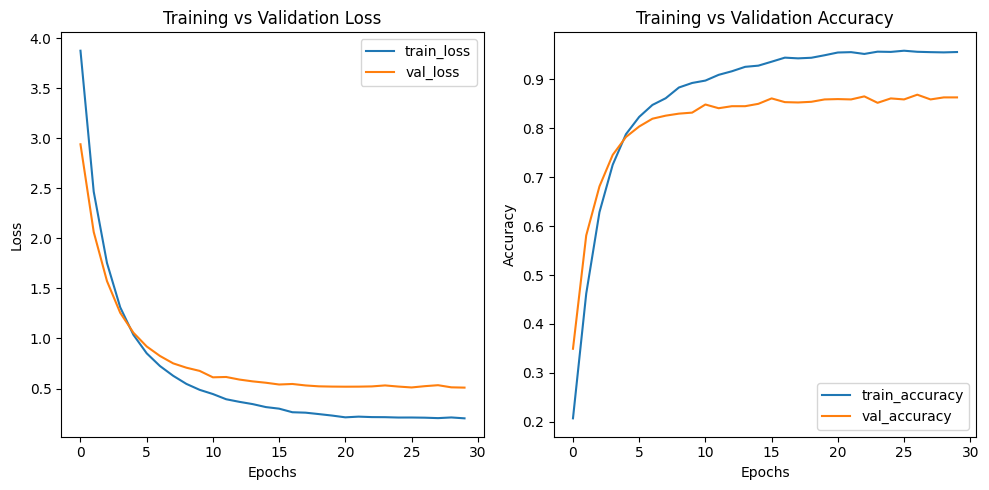

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

### Training 1: Second set of transformations

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.uint8, scale=True),
        v2.Resize(256, antialias=True),
        v2.RandomRotation(10),
        v2.CenterCrop(224),
        v2.RandomHorizontalFlip(p=0.5),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

# Define transforms for the evaluation phase
eval_transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.uint8, scale=True),
        v2.Resize(256, antialias=True),
        v2.CenterCrop(224),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

train_dataset = Caltech(DATA_DIR, split='train', transform=train_transform)
test_dataset = Caltech(DATA_DIR, split='test', transform=eval_transform)

train_indexes, val_indexes, _, _ = train_test_split(range(len(train_dataset)), train_dataset.labels, test_size=0.25, random_state=0, stratify=train_dataset.labels)

val_dataset = Subset(train_dataset, val_indexes)
train_dataset = Subset(train_dataset, train_indexes)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.8646790981292725
Training Accuracy: 0.205078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.9211692810058594
Validation Accuracy: 0.33748271092669435
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.4441568851470947
Training Accuracy: 0.463134765625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.041104793548584
Validation Accuracy: 0.5912863070539419
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.7504562139511108
Training Accuracy: 0.627685546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.5639878511428833
Validation Accuracy: 0.6763485477178424
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.3145461082458496
Training Accuracy: 0.728515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.2574107646942139
Validation Accuracy: 0.7461964038727524
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.040317177772522
Training Accuracy: 0.788818359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.0578484535217285
Validation Accuracy: 0.7766251728907331
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.8487169146537781
Training Accuracy: 0.82763671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.9206417202949524
Validation Accuracy: 0.7897648686030428
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7074069380760193
Training Accuracy: 0.85107421875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8155310750007629
Validation Accuracy: 0.8278008298755186
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.6197354197502136
Training Accuracy: 0.8662109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7613486051559448
Validation Accuracy: 0.8174273858921162
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.540093183517456
Training Accuracy: 0.878662109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7176076769828796
Validation Accuracy: 0.8174273858921162
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4888765811920166
Training Accuracy: 0.893310546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6779829859733582
Validation Accuracy: 0.8354080221300139
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4331696331501007
Training Accuracy: 0.901123046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6518664360046387
Validation Accuracy: 0.8340248962655602
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4046100378036499
Training Accuracy: 0.910400390625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6317464113235474
Validation Accuracy: 0.8381742738589212
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.36815309524536133
Training Accuracy: 0.917236328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.606007993221283
Validation Accuracy: 0.8499308437067773
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.32773417234420776
Training Accuracy: 0.929443359375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6021242737770081
Validation Accuracy: 0.84716459197787
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.30971622467041016
Training Accuracy: 0.934326171875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5762925148010254
Validation Accuracy: 0.843015214384509
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.29425743222236633
Training Accuracy: 0.932861328125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5717477798461914
Validation Accuracy: 0.843015214384509
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2670573592185974
Training Accuracy: 0.939697265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5512325167655945
Validation Accuracy: 0.851313969571231
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.25658178329467773
Training Accuracy: 0.941162109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.552789032459259
Validation Accuracy: 0.851313969571231
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.24172350764274597
Training Accuracy: 0.945556640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5511720180511475
Validation Accuracy: 0.8478561549100968
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.22452957928180695
Training Accuracy: 0.95263671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5469961762428284
Validation Accuracy: 0.8499308437067773
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21438753604888916
Training Accuracy: 0.95751953125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5358320474624634
Validation Accuracy: 0.8526970954356846
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.22537758946418762
Training Accuracy: 0.950927734375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5311131477355957
Validation Accuracy: 0.8533886583679114
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20725573599338531
Training Accuracy: 0.954833984375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5358282327651978
Validation Accuracy: 0.8540802213001383
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20422761142253876
Training Accuracy: 0.959228515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5374797582626343
Validation Accuracy: 0.8568464730290456
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20684505999088287
Training Accuracy: 0.960205078125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5418294668197632
Validation Accuracy: 0.8506224066390041
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.20299659669399261
Training Accuracy: 0.9599609375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5358961820602417
Validation Accuracy: 0.8603042876901799
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2044680118560791
Training Accuracy: 0.95947265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5218732357025146
Validation Accuracy: 0.8603042876901799
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.21167930960655212
Training Accuracy: 0.954345703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5351687669754028
Validation Accuracy: 0.851313969571231
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.19847916066646576
Training Accuracy: 0.955810546875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5323052406311035
Validation Accuracy: 0.8603042876901799
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.19534507393836975
Training Accuracy: 0.96142578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5371505618095398
Validation Accuracy: 0.8520055325034578


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.5235936641693115
Test Accuracy: 0.8555133079847909


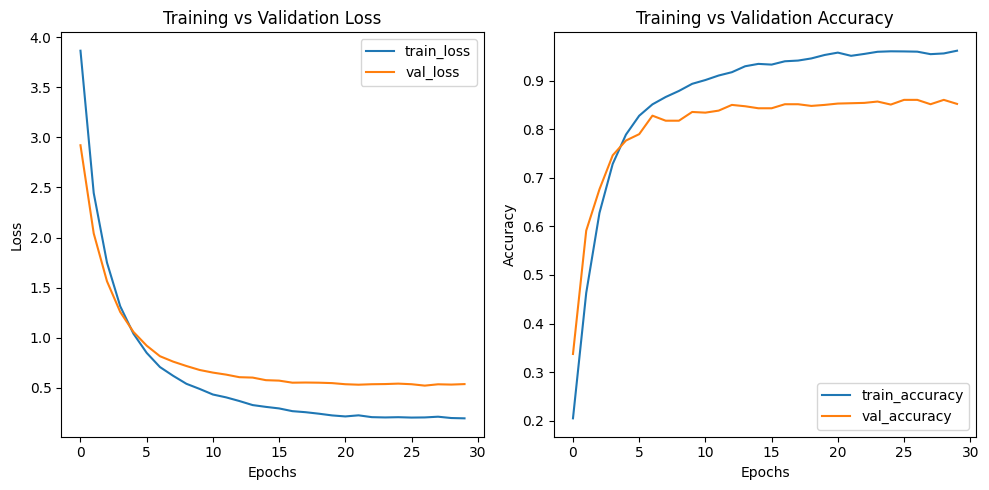

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

### Training 1: Third set of transformations

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101

BATCH_SIZE = 256

LR = 1e-3
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 30
STEP_SIZE = 20
GAMMA = 0.1

train_transform = v2.Compose([v2.ToImage(),
                              v2.ToDtype(torch.uint8, scale=True),
                              v2.Resize(256, antialias=True),
                              v2.RandomRotation(10),
                              v2.CenterCrop(224),
                              v2.RandomHorizontalFlip(p=0.5),
                              v2.RandomApply(nn.ModuleList([v2.ColorJitter(brightness=0.7, contrast=None, saturation=None, hue=None)]), p=0.5),
                              v2.ToDtype(torch.float32, scale=True),
                              v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])

# Define transforms for the evaluation phase
eval_transform = v2.Compose([v2.ToImage(),
                             v2.ToDtype(torch.uint8, scale=True),
                             v2.Resize(256, antialias=True),
                             v2.CenterCrop(224),
                             v2.ToDtype(torch.float32, scale=True),
                             v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = Caltech(DATA_DIR, split='train', transform=train_transform)
test_dataset = Caltech(DATA_DIR, split='test', transform=eval_transform)

train_indexes, val_indexes, _, _ = train_test_split(range(len(train_dataset)), train_dataset.labels, test_size=0.25, random_state=0, stratify=train_dataset.labels)

val_dataset = Subset(train_dataset, val_indexes)
train_dataset = Subset(train_dataset, train_indexes)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = alexnet(weights='DEFAULT')
net.classifier[6] = nn.Linear(4096, NUM_CLASSES)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.classifier.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


- Starting epoch 1/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 3.9448492527008057
Training Accuracy: 0.180908203125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.952383518218994
Validation Accuracy: 0.3236514522821577
- Starting epoch 2/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 2.5069916248321533
Training Accuracy: 0.443603515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 2.13814640045166
Validation Accuracy: 0.5456431535269709
- Starting epoch 3/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.824547529220581
Training Accuracy: 0.614013671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.6543240547180176
Validation Accuracy: 0.6514522821576764
- Starting epoch 4/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.4167076349258423
Training Accuracy: 0.7021484375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.3569291830062866
Validation Accuracy: 0.7185338865836791
- Starting epoch 5/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 1.1397181749343872
Training Accuracy: 0.764404296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.1440329551696777
Validation Accuracy: 0.7482710926694329
- Starting epoch 6/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.9377534985542297
Training Accuracy: 0.804931640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 1.013340950012207
Validation Accuracy: 0.7731673582295989
- Starting epoch 7/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.7949897646903992
Training Accuracy: 0.8369140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.9016441702842712
Validation Accuracy: 0.7939142461964038
- Starting epoch 8/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.705185055732727
Training Accuracy: 0.84228515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.8222915530204773
Validation Accuracy: 0.8077455048409405
- Starting epoch 9/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.6104071140289307
Training Accuracy: 0.86962890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7832751274108887
Validation Accuracy: 0.809820193637621
- Starting epoch 10/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.5659811496734619
Training Accuracy: 0.873046875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.7348704934120178
Validation Accuracy: 0.8250345781466113
- Starting epoch 11/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.5066483020782471
Training Accuracy: 0.88671875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6995047330856323
Validation Accuracy: 0.8215767634854771
- Starting epoch 12/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.47356072068214417
Training Accuracy: 0.890625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6838777661323547
Validation Accuracy: 0.8243430152143845
- Starting epoch 13/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.42444145679473877
Training Accuracy: 0.8994140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6460520029067993
Validation Accuracy: 0.834716459197787
- Starting epoch 14/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.4015986919403076
Training Accuracy: 0.90625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6452180743217468
Validation Accuracy: 0.8291839557399724
- Starting epoch 15/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3798534572124481
Training Accuracy: 0.909912109375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6562673449516296
Validation Accuracy: 0.8298755186721992
- Starting epoch 16/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.35118091106414795
Training Accuracy: 0.921142578125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6267422437667847
Validation Accuracy: 0.8360995850622407
- Starting epoch 17/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.3376898765563965
Training Accuracy: 0.921630859375


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6144496202468872
Validation Accuracy: 0.8381742738589212
- Starting epoch 18/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.31807222962379456
Training Accuracy: 0.92431640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6118217706680298
Validation Accuracy: 0.8402489626556017
- Starting epoch 19/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.30891916155815125
Training Accuracy: 0.931640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.598612368106842
Validation Accuracy: 0.8381742738589212
- Starting epoch 20/30, LR = [0.001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.29193323850631714
Training Accuracy: 0.9296875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5785961747169495
Validation Accuracy: 0.8443983402489627
- Starting epoch 21/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2769519090652466
Training Accuracy: 0.931640625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5964527130126953
Validation Accuracy: 0.8423236514522822
- Starting epoch 22/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.26488274335861206
Training Accuracy: 0.937744140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5791875123977661
Validation Accuracy: 0.851313969571231
- Starting epoch 23/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.25504863262176514
Training Accuracy: 0.94140625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.6003699898719788
Validation Accuracy: 0.8395573997233748
- Starting epoch 24/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2589673697948456
Training Accuracy: 0.944091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.579988420009613
Validation Accuracy: 0.8423236514522822
- Starting epoch 25/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2753850221633911
Training Accuracy: 0.9345703125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5965039730072021
Validation Accuracy: 0.838865836791148
- Starting epoch 26/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2636215090751648
Training Accuracy: 0.939453125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5639040470123291
Validation Accuracy: 0.8520055325034578
- Starting epoch 27/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.256531298160553
Training Accuracy: 0.94091796875


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5760353803634644
Validation Accuracy: 0.8443983402489627
- Starting epoch 28/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.265625536441803
Training Accuracy: 0.93603515625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5774495601654053
Validation Accuracy: 0.8533886583679114
- Starting epoch 29/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.2613913416862488
Training Accuracy: 0.939697265625


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5730562210083008
Validation Accuracy: 0.8478561549100968
- Starting epoch 30/30, LR = [0.0001]


  0%|          | 0/16 [00:00<?, ?it/s]

Training Loss: 0.25459763407707214
Training Accuracy: 0.940673828125


  0%|          | 0/6 [00:00<?, ?it/s]

Validation Loss: 0.5823954939842224
Validation Accuracy: 0.8416320885200553


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/12 [00:00<?, ?it/s]

Test Loss: 0.5230838656425476
Test Accuracy: 0.8534393363290702


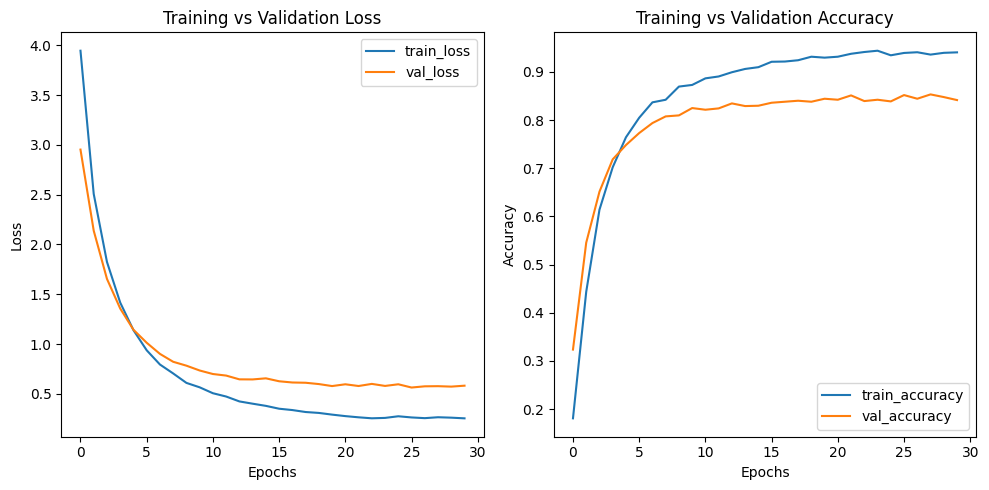

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)

# Step 5: Beyond AlexNet

In [ ]:
DEVICE = 'cuda'

NUM_CLASSES = 101
HIDDEN_SIZE = 512

BATCH_SIZE = 128

LR = 1e-2
MOMENTUM = 0.9
WEIGHT_DECAY = 5e-5

NUM_EPOCHS = 40
STEP_SIZE = 20
GAMMA = 0.1

train_transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.uint8, scale=True),
        v2.Resize(256, antialias=True),
        v2.RandomRotation(10),
        v2.CenterCrop(224),
        v2.RandomHorizontalFlip(p=0.5),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

# Define transforms for the evaluation phase
eval_transform = v2.Compose(
    [
        v2.ToImage(),
        v2.ToDtype(torch.uint8, scale=True),
        v2.Resize(256, antialias=True),
        v2.CenterCrop(224),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]
)

train_dataset = Caltech(DATA_DIR, split='train', transform=train_transform)
test_dataset = Caltech(DATA_DIR, split='test', transform=eval_transform)

train_indexes, val_indexes, _, _ = train_test_split(range(len(train_dataset)), train_dataset.labels, test_size=0.25, random_state=0, stratify=train_dataset.labels)

val_dataset = Subset(train_dataset, val_indexes)
train_dataset = Subset(train_dataset, train_indexes)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, drop_last=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

net = resnet50(weights='DEFAULT')
net.fc = nn.Sequential(
  nn.Linear(net.fc.in_features, HIDDEN_SIZE),
  nn.Linear(HIDDEN_SIZE, NUM_CLASSES),
)

criterion = nn.CrossEntropyLoss()
parameters_to_optimize = net.fc.parameters()
optimizer = optim.SGD(parameters_to_optimize, lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=STEP_SIZE, gamma=GAMMA)

current_net_state_dict, train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history = train_and_evaluate(NUM_EPOCHS, net, criterion, optimizer, scheduler, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


- Starting epoch 1/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 3.9436655044555664
Training Accuracy: 0.22135416666666666


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 3.259533405303955
Validation Accuracy: 0.2897648686030429
- Starting epoch 2/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 2.9700145721435547
Training Accuracy: 0.3984375


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 2.7133727073669434
Validation Accuracy: 0.5048409405255878
- Starting epoch 3/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 2.4856252670288086
Training Accuracy: 0.5601325757575758


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 2.294725179672241
Validation Accuracy: 0.6141078838174274
- Starting epoch 4/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 2.0699586868286133
Training Accuracy: 0.6811079545454546


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 1.9004104137420654
Validation Accuracy: 0.7233748271092669
- Starting epoch 5/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 1.6819452047348022
Training Accuracy: 0.7521306818181818


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 1.5590295791625977
Validation Accuracy: 0.7607192254495159
- Starting epoch 6/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 1.3480530977249146
Training Accuracy: 0.7997159090909091


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 1.2681243419647217
Validation Accuracy: 0.8084370677731674
- Starting epoch 7/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 1.0999947786331177
Training Accuracy: 0.834280303030303


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 1.05942964553833
Validation Accuracy: 0.8291839557399724
- Starting epoch 8/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.8944389224052429
Training Accuracy: 0.8636363636363636


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.8863788843154907
Validation Accuracy: 0.8603042876901799
- Starting epoch 9/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.7381919622421265
Training Accuracy: 0.8873106060606061


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.7642964124679565
Validation Accuracy: 0.8706777316735823
- Starting epoch 10/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.6302801966667175
Training Accuracy: 0.9053030303030303


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.6713846325874329
Validation Accuracy: 0.8900414937759336
- Starting epoch 11/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.5487200617790222
Training Accuracy: 0.9171401515151515


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.6195796728134155
Validation Accuracy: 0.8955739972337483
- Starting epoch 12/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.48536279797554016
Training Accuracy: 0.9251893939393939


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.5475453734397888
Validation Accuracy: 0.896957123098202
- Starting epoch 13/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.4310280382633209
Training Accuracy: 0.9292140151515151


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.5056267976760864
Validation Accuracy: 0.9059474412171508
- Starting epoch 14/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.38845351338386536
Training Accuracy: 0.9348958333333334


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.4798991084098816
Validation Accuracy: 0.9045643153526971
- Starting epoch 15/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.35274678468704224
Training Accuracy: 0.9427083333333334


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.4494814872741699
Validation Accuracy: 0.9087136929460581
- Starting epoch 16/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.32258325815200806
Training Accuracy: 0.9396306818181818


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.4260666072368622
Validation Accuracy: 0.9073305670816044
- Starting epoch 17/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.3076483905315399
Training Accuracy: 0.9429450757575758


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.40564224123954773
Validation Accuracy: 0.9163208852005532
- Starting epoch 18/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2780704200267792
Training Accuracy: 0.9517045454545454


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.39685502648353577
Validation Accuracy: 0.9135546334716459
- Starting epoch 19/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.265008807182312
Training Accuracy: 0.9517045454545454


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3905085623264313
Validation Accuracy: 0.9149377593360996
- Starting epoch 20/40, LR = [0.01]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.24863669276237488
Training Accuracy: 0.9566761363636364


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.367967426776886
Validation Accuracy: 0.9190871369294605
- Starting epoch 21/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2386271357536316
Training Accuracy: 0.9562026515151515


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.37690842151641846
Validation Accuracy: 0.9121715076071922
- Starting epoch 22/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.23380282521247864
Training Accuracy: 0.9602272727272727


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.37656933069229126
Validation Accuracy: 0.9142461964038727
- Starting epoch 23/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.23292642831802368
Training Accuracy: 0.9585700757575758


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3625850975513458
Validation Accuracy: 0.9204702627939142
- Starting epoch 24/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2296321541070938
Training Accuracy: 0.9628314393939394


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3782416582107544
Validation Accuracy: 0.9177040110650069
- Starting epoch 25/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.23307262361049652
Training Accuracy: 0.9590435606060606


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.36842843890190125
Validation Accuracy: 0.91701244813278
- Starting epoch 26/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.22646521031856537
Training Accuracy: 0.959280303030303


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3699420988559723
Validation Accuracy: 0.9177040110650069
- Starting epoch 27/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2235887199640274
Training Accuracy: 0.9611742424242424


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.35068458318710327
Validation Accuracy: 0.9204702627939142
- Starting epoch 28/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2308546006679535
Training Accuracy: 0.9588068181818182


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.36433807015419006
Validation Accuracy: 0.921161825726141
- Starting epoch 29/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.23467975854873657
Training Accuracy: 0.9562026515151515


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3723047971725464
Validation Accuracy: 0.9163208852005532
- Starting epoch 30/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.22062650322914124
Training Accuracy: 0.9611742424242424


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.35768523812294006
Validation Accuracy: 0.9204702627939142
- Starting epoch 31/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.22447910904884338
Training Accuracy: 0.9569128787878788


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3594400882720947
Validation Accuracy: 0.921161825726141
- Starting epoch 32/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.22413070499897003
Training Accuracy: 0.9614109848484849


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3634897470474243
Validation Accuracy: 0.9204702627939142
- Starting epoch 33/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2246769815683365
Training Accuracy: 0.9571496212121212


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3631631135940552
Validation Accuracy: 0.9204702627939142
- Starting epoch 34/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.21679724752902985
Training Accuracy: 0.9621212121212122


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3489527702331543
Validation Accuracy: 0.9197786998616874
- Starting epoch 35/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.21738508343696594
Training Accuracy: 0.9621212121212122


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3658868670463562
Validation Accuracy: 0.9190871369294605
- Starting epoch 36/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.21919786930084229
Training Accuracy: 0.962594696969697


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.36040014028549194
Validation Accuracy: 0.9197786998616874
- Starting epoch 37/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2183665931224823
Training Accuracy: 0.9618844696969697


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.35765212774276733
Validation Accuracy: 0.9128630705394191
- Starting epoch 38/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.22031782567501068
Training Accuracy: 0.9628314393939394


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3568473160266876
Validation Accuracy: 0.9225449515905948
- Starting epoch 39/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.2212262898683548
Training Accuracy: 0.9595170454545454


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3592131435871124
Validation Accuracy: 0.9156293222683264
- Starting epoch 40/40, LR = [0.001]


  0%|          | 0/33 [00:00<?, ?it/s]

Training Loss: 0.21632982790470123
Training Accuracy: 0.9614109848484849


  0%|          | 0/12 [00:00<?, ?it/s]

Validation Loss: 0.3606327176094055
Validation Accuracy: 0.9232365145228216


In [ ]:
net.load_state_dict(current_net_state_dict)
test_net(net, test_dataloader, criterion)

  0%|          | 0/23 [00:00<?, ?it/s]

Test Loss: 0.33780843019485474
Test Accuracy: 0.9208434151399931


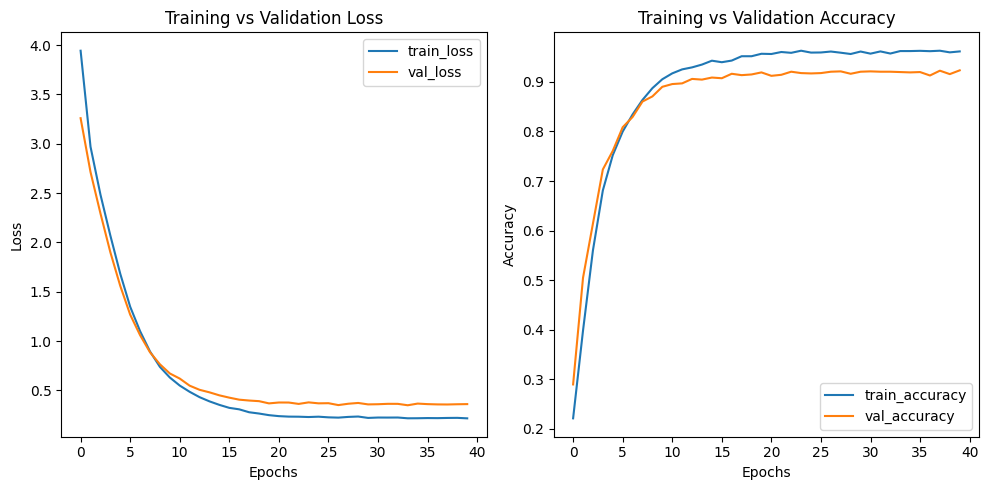

In [ ]:
plot_loss_accuracy(train_loss_history, train_accuracy_history, val_loss_history, val_accuracy_history)